<a href="https://colab.research.google.com/github/phaneeshwar/Telecom-Churn-Case-Study-/blob/main/Telecom_Churn_Case_Study_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Telecom Chrun Case Study
##### By :
###### M.Phaneeshwar
###### Pragati Shinde

## Steps Of Execution
1. Reading,Understanding and visualising the data
2. Preparing the data for modeling (test-train, rescaling etc)
3. Training the model
4. Choosing the Best Model
5. Choosing the Important Features


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns',300)
pd.set_option('display.max_rows',300)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import chardet
with open('/content/drive/MyDrive/Telecom Churn Case Study/telecom_churn_data.csv','rb') as rawdata:
    result = chardet.detect(rawdata.read(5000))
print(result)

{'encoding': 'ascii', 'confidence': 1.0, 'language': ''}


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Telecom Churn Case Study/telecom_churn_data.csv')

## Step 1: Data Understanding, Cleaning, Visualization

In [ ]:
df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [ ]:
df.shape

(99999, 226)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


In [ ]:
df.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

#### mobile_number column is not informative for the churn analysis hence it can be removed and there are few features that carry only zero value, such columns would be removed

In [ ]:
cols_remove = ['mobile_number','circle_id','loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou','std_og_t2c_mou_6','std_og_t2c_mou_7','std_og_t2c_mou_8','std_og_t2c_mou_9',
               'std_ic_t2o_mou_6','std_ic_t2o_mou_7','std_ic_t2o_mou_8','std_ic_t2o_mou_9']
df.drop(cols_remove,inplace = True,axis = 1)

In [ ]:
df.shape

(99999, 213)

In [ ]:
df.head()

,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,0.0,0.0,0.0,NaN,1.0,1.0,1.0,NaN,252.0,252.0,252.0,NaN,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,21

In [ ]:
x = pd.DataFrame(round(100 * df.isnull().sum() / len(df),2)).reset_index()
x.columns = ['Columns','PercentageNull']
x1 = x[x.PercentageNull > 20]
x1

,Columns,PercentageNull
144,date_of_last_rech_data_6,74.85
145,date_of_last_rech_data_7,74.43
146,date_of_last_rech_data_8,73.66
147,date_of_last_rech_data_9,74.08
148,total_rech_data_6,74.85
149,total_rech_data_7,74.43
150,total_rech_data_8,73.66
151,total_rech_data_9,74.08
152,max_rech_data_6,74.85
153,max_rech_data_7,74.43


#### It is observed that around 40 columns have null values above 70%, and some of these variables are required for the further analyses hence these variables cant be removed hence we impute the values. It is observed that Arounf 74% custormers have not done any recharge, and the min value 1 hence we impute all the NaN values to zero

In [ ]:
df[list(x1.Columns)[0:24]] = df[list(x1.Columns)[0:24]].fillna(0)

In [ ]:
df[list(x[x.PercentageNull > 20][32:].Columns)] = df[list(x[x.PercentageNull > 20][32:].Columns)].fillna(-1)

In [ ]:
x = pd.DataFrame(round(100 * df.isnull().sum() / len(df),2)).reset_index()
x.columns = ['Columns','PercentageNull']
x1 = x[x.PercentageNull > 50]
x1

,Columns,PercentageNull
176,arpu_3g_6,74.85
177,arpu_3g_7,74.43
178,arpu_3g_8,73.66
179,arpu_3g_9,74.08
180,arpu_2g_6,74.85
181,arpu_2g_7,74.43
182,arpu_2g_8,73.66
183,arpu_2g_9,74.08


In [ ]:
df.drop(list(x1.Columns),inplace = True, axis = 1)

In [ ]:
df.shape

(99999, 205)

In [ ]:
Dates = list(df.select_dtypes(include = 'object').columns)

In [ ]:
df[Dates].head()

,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9
0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/21/2014,7/16/2014,8/8/2014,9/28/2014,6/21/2014,7/16/2014,8/8/2014,0
1,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/29/2014,7/31/2014,8/28/2014,9/30/2014,0,7/25/2014,8/10/2014,0
2,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/17/2014,7/24/2014,8/14/2014,9/29/2014,0,0,0,9/17/2014
3,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/28/2014,7/31/2014,8/31/2014,9/30/2014,0,0,0,0
4,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/26/2014,7/28/2014,8/9/2014,9/28/2014,6/4/2014,0,0,0


In [ ]:
df.drop(Dates,inplace = True,axis = 1)

In [ ]:
x = pd.DataFrame(round(100 * df.isnull().sum() / len(df),2)).reset_index()
x.columns = ['Columns','PercentageNull']
x

,Columns,PercentageNull
0,arpu_6,0.00
1,arpu_7,0.00
2,arpu_8,0.00
3,arpu_9,0.00
4,onnet_mou_6,3.94
5,onnet_mou_7,3.86
6,onnet_mou_8,5.38
7,onnet_mou_9,7.75
8,offnet_mou_6,3.94
9,offnet_mou_7,3.86


#### Imputing the Missing Values Using SimpleImputer

In [ ]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy='median')
cols = list(x.Columns)
df[cols] = imputer.fit_transform(df[cols])

In [ ]:
df.isnull().sum()

arpu_6                0
arpu_7                0
arpu_8                0
arpu_9                0
onnet_mou_6           0
onnet_mou_7           0
onnet_mou_8           0
onnet_mou_9           0
offnet_mou_6          0
offnet_mou_7          0
offnet_mou_8          0
offnet_mou_9          0
roam_ic_mou_6         0
roam_ic_mou_7         0
roam_ic_mou_8         0
roam_ic_mou_9         0
roam_og_mou_6         0
roam_og_mou_7         0
roam_og_mou_8         0
roam_og_mou_9         0
loc_og_t2t_mou_6      0
loc_og_t2t_mou_7      0
loc_og_t2t_mou_8      0
loc_og_t2t_mou_9      0
loc_og_t2m_mou_6      0
loc_og_t2m_mou_7      0
loc_og_t2m_mou_8      0
loc_og_t2m_mou_9      0
loc_og_t2f_mou_6      0
loc_og_t2f_mou_7      0
loc_og_t2f_mou_8      0
loc_og_t2f_mou_9      0
loc_og_t2c_mou_6      0
loc_og_t2c_mou_7      0
loc_og_t2c_mou_8      0
loc_og_t2c_mou_9      0
loc_og_mou_6          0
loc_og_mou_7          0
loc_og_mou_8          0
loc_og_mou_9          0
std_og_t2t_mou_6      0
std_og_t2t_mou_7

#### Filter high-value customers
#### To extract the top Custormers, abov 70th percentile of the avg total recharge amount of month 6 and 7

In [ ]:
df['total_data_rech_6'] = df.total_rech_data_6 * df.av_rech_amt_data_6
df['total_data_rech_7'] = df.total_rech_data_7 * df.av_rech_amt_data_7
df['total_data_rech_8'] = df.total_rech_data_8 * df.av_rech_amt_data_8
df['total_data_rech_9'] = df.total_rech_data_9 * df.av_rech_amt_data_9

In [ ]:
drop_cols = ['total_rech_data_6','av_rech_amt_data_6','total_rech_data_7','av_rech_amt_data_7','total_rech_data_8','av_rech_amt_data_8',
             'total_rech_data_9','av_rech_amt_data_9']
df.drop(drop_cols,inplace = True,axis = 1)

In [ ]:
df['amt_data_6'] = df['total_rech_amt_6'] + df['total_data_rech_6']
df['amt_data_7'] = df['total_rech_amt_7'] + df['total_data_rech_7']
df['amt_data_8'] = df['total_rech_amt_8'] + df['total_data_rech_8']
df.drop(['total_rech_amt_6','total_rech_amt_7','total_rech_amt_8','total_data_rech_6','total_data_rech_7','total_data_rech_8'],inplace = True,axis = 1)

In [ ]:
df['avg_amt_6_7'] = df[['amt_data_6','amt_data_7']].mean(axis=1)
data_temp = (df['amt_data_6'] + df['amt_data_7'])/2

In [ ]:
percentile_70 = data_temp.quantile(0.7)
print('70 th Percentile of the Average Amount is :',percentile_70)

70 th Percentile of the Average Amount is : 478.0


In [ ]:
df = df[data_temp >= percentile_70]

In [ ]:
df.head()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,total_data_rech_9,amt_data_6,amt_data_7,amt_data_8,avg_amt_6_7
0,197.385,214.816,213.803,21.100,34.31,32.33,0.00,29.84,96.31,91.735,0.00,87.29,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,11.91,11.61,0.00,11.26,41.03,40.43,0.00,39.12,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,65.11,63.685,0.00,61.84,0.00,0.00,0.00,0.00,3.95,3.635,0.00,2.50,0.00,0.00,0.00,0.00,11.64,11.09,0.00,8.41,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,15.69,15.74,0.16,15.66,56.49,57.08,4.13,56.61,0.88,0.93,1.15,0.96,92.16,92.55,5.44,91.64,0.00,0.00,0.00,0.00,2.03,2.04,0.00,1.74,0.00,0.00,0.00,0.0,5.89,5.96,0.00,5.38,0.00,0.00,5.44,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,4.0,3.0,2.0,6.0,0.0,252.0,252.0,252.0,0.0,252.0,252.0,252.0,0.0,252.0,252.0,252.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,30.13,1.32,5.75,0.00,83.57,150.76,109.61,0.00,0.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,-1.0,968.0,30.40,0.00,101.20,3.58,0.0,614.0,504.0,504.0,559.0
7,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,29.84,453.43,567.160,325.91,87.29,16.23,33.49,31.64,0.0,23.74,12.59,38.06,0.0,51.39,31.38,40.28,11.26,308.63,447.38,162.28,39.12,62.13,55.14,53.23,0.00,0.0,0.0,0.00,0.00,422.16,533.910,255.79,61.84,4.30,23.29,12.01,0.00,49.89,31.760,49.14,2.50,6.66,20.08,16.68,0.00,60.86,75.14,77.84,8.41,0.0,0.18,10.01,0.0,4.5,0.0,6

In [ ]:
df.shape

(30001, 187)

##### Tag churners and remove attributes of the churn phase

In [ ]:
churn_phase = ['total_ic_mou_9','total_og_mou_9','vol_2g_mb_9','vol_3g_mb_9']
df[churn_phase].describe()

,total_ic_mou_9,total_og_mou_9,vol_2g_mb_9,vol_3g_mb_9
count,30001.000000,30001.000000,30001.000000,30001.000000
mean,264.901497,500.869219,91.435910,349.513848
std,358.290694,666.902007,282.370006,947.079372
min,0.000000,0.000000,0.000000,0.000000
25%,50.480000,47.640000,0.000000,0.000000
50%,157.980000,284.940000,0.000000,0.000000
75%,343.540000,698.680000,38.000000,320.610000
max,7785.730000,11517.730000,8993.950000,39221.270000


##### Lets create a new column called as churn, which consist of values 1 & 0, this column is used as predictor variable and the value 1 and 0m is assigned based on these four variables  'total_ic_mou_9','total_og_mou_9','vol_2g_mb_9','vol_3g_mb_9'

In [ ]:
df['churn'] = df.apply(lambda x: 1 if ((x.total_ic_mou_9 == 0) & (x.total_og_mou_9 == 0) & (x.vol_2g_mb_9 == 0) & (x.vol_3g_mb_9 == 0)) else 0, axis = 1) 

In [ ]:
print('total number of churns and non-churns are :',df['churn'].value_counts())
print('percentages of churn and non-churn:',100 * (df['churn'].value_counts()) / len(df))

total number of churns and non-churns are : 0    27560
1     2441
Name: churn, dtype: int64
percentages of churn and non-churn: 0    91.863605
1     8.136395
Name: churn, dtype: float64


##### It is observerd that there is class imbalance in dataset, around 92% custormers have not churned and 8% of the custormers have churned, hence imblace in the dataset must be considered while building up an ML model

In [ ]:
churn_phase = list()
for i in list(df.columns):
    if (i[-1] == '9'):
        churn_phase.append(i)
    else:
        continue
print(churn_phase)

['arpu_9', 'onnet_mou_9', 'offnet_mou_9', 'roam_ic_mou_9', 'roam_og_mou_9', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_9', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_9', 'loc_og_mou_9', 'std_og_t2t_mou_9', 'std_og_t2m_mou_9', 'std_og_t2f_mou_9', 'std_og_mou_9', 'isd_og_mou_9', 'spl_og_mou_9', 'og_others_9', 'total_og_mou_9', 'loc_ic_t2t_mou_9', 'loc_ic_t2m_mou_9', 'loc_ic_t2f_mou_9', 'loc_ic_mou_9', 'std_ic_t2t_mou_9', 'std_ic_t2m_mou_9', 'std_ic_t2f_mou_9', 'std_ic_mou_9', 'total_ic_mou_9', 'spl_ic_mou_9', 'isd_ic_mou_9', 'ic_others_9', 'total_rech_num_9', 'total_rech_amt_9', 'max_rech_amt_9', 'last_day_rch_amt_9', 'max_rech_data_9', 'count_rech_2g_9', 'count_rech_3g_9', 'vol_2g_mb_9', 'vol_3g_mb_9', 'night_pck_user_9', 'monthly_2g_9', 'sachet_2g_9', 'monthly_3g_9', 'sachet_3g_9', 'fb_user_9', 'total_data_rech_9']


In [ ]:
df.drop(churn_phase,inplace = True, axis = 1)

In [ ]:
df.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,amt_data_6,amt_data_7,amt_data_8,avg_amt_6_7,churn
0,197.385,214.816,213.803,34.31,32.33,0.00,96.31,91.735,0.00,0.00,0.00,0.00,0.00,0.00,0.00,11.91,11.61,0.00,41.03,40.43,0.00,0.00,0.00,0.00,0.0,0.0,0.00,65.11,63.685,0.00,0.00,0.00,0.00,3.95,3.635,0.00,0.00,0.00,0.00,11.64,11.09,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,15.69,15.74,0.16,56.49,57.08,4.13,0.88,0.93,1.15,92.16,92.55,5.44,0.00,0.00,0.00,2.03,2.04,0.00,0.00,0.00,0.00,5.89,5.96,0.00,0.00,0.00,5.44,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,4.0,3.0,2.0,252.0,252.0,252.0,252.0,252.0,252.0,252.0,252.0,252.0,0.0,0.0,0.0,1.0,1.0,1.0,30.13,1.32,5.75,83.57,150.76,109.61,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,968.0,30.40,0.00,101.20,3.58,614.0,504.0,504.0,559.0,1
7,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.160,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.910,255.79,4.30,23.29,12.01,49.89,31.760,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5.0,5.0,7.0,1580.0,790.0,1580.0,0.0,0.0,779.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,-1.0,-1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,802.0,57.74,19.38,18.74,0.00,1580.0,790.0,3638.0,1185.0,1
8,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.630,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.180,63.04,116.56,133.43,22.58,13.69,10.040,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.0,0.0,10.23,0.0,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,2

In [ ]:
df.shape

(30001, 142)

#### Calculate the difference between the 8th month and the avergae of the 6th and the 7th month

In [ ]:
df['arpu_diff'] = df.arpu_8 - ((df.arpu_6 + df.arpu_7)/2)

df['onnet_mou_diff'] = df.onnet_mou_8 - ((df.onnet_mou_6 + df.onnet_mou_7)/2)

df['offnet_mou_diff'] = df.offnet_mou_8 - ((df.offnet_mou_6 + df.offnet_mou_7)/2)

df['roam_ic_mou_diff'] = df.roam_ic_mou_8 - ((df.roam_ic_mou_6 + df.roam_ic_mou_7)/2)

df['roam_og_mou_diff'] = df.roam_og_mou_8 - ((df.roam_og_mou_6 + df.roam_og_mou_7)/2)

df['loc_og_mou_diff'] = df.loc_og_mou_8 - ((df.loc_og_mou_6 + df.loc_og_mou_7)/2)

df['std_og_mou_diff'] = df.std_og_mou_8 - ((df.std_og_mou_6 + df.std_og_mou_7)/2)

df['isd_og_mou_diff'] = df.isd_og_mou_8 - ((df.isd_og_mou_6 + df.isd_og_mou_7)/2)

df['spl_og_mou_diff'] = df.spl_og_mou_8 - ((df.spl_og_mou_6 + df.spl_og_mou_7)/2)

df['total_og_mou_diff'] = df.total_og_mou_8 - ((df.total_og_mou_6 + df.total_og_mou_7)/2)

df['loc_ic_mou_diff'] = df.loc_ic_mou_8 - ((df.loc_ic_mou_6 + df.loc_ic_mou_7)/2)

df['std_ic_mou_diff'] = df.std_ic_mou_8 - ((df.std_ic_mou_6 + df.std_ic_mou_7)/2)

df['isd_ic_mou_diff'] = df.isd_ic_mou_8 - ((df.isd_ic_mou_6 + df.isd_ic_mou_7)/2)

df['spl_ic_mou_diff'] = df.spl_ic_mou_8 - ((df.spl_ic_mou_6 + df.spl_ic_mou_7)/2)

df['total_ic_mou_diff'] = df.total_ic_mou_8 - ((df.total_ic_mou_6 + df.total_ic_mou_7)/2)

df['total_rech_num_diff'] = df.total_rech_num_8 - ((df.total_rech_num_6 + df.total_rech_num_7)/2)

df['total_rech_amt_diff'] = df['amt_data_8'] - ((df['amt_data_6'] + df['amt_data_7'])/2)

df['max_rech_amt_diff'] = df.max_rech_amt_8 - ((df.max_rech_amt_6 + df.max_rech_amt_7)/2)

df['max_rech_data_diff'] = df.max_rech_data_8 - ((df.max_rech_data_6 + df.max_rech_data_7)/2)

df['vol_2g_mb_diff'] = df.vol_2g_mb_8 - ((df.vol_2g_mb_6 + df.vol_2g_mb_7)/2)

df['vol_3g_mb_diff'] = df.vol_3g_mb_8 - ((df.vol_3g_mb_6 + df.vol_3g_mb_7)/2)


##### highly correlated columns in the Dataset having correlation value greater than 0.7

In [ ]:
cor_matrix = df.corr().abs()
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.70)]
print(to_drop)


['arpu_8', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_7', 'offnet_mou_8', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_7', 'isd_og_mou_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_7', 'loc_ic_t2f_mou_8', 'loc_ic_mou_6', 'loc_ic_mou_7', 'loc_ic_mou_8', 'std_ic_t2t_mou_7', 'std_ic_t2t_mou_8', 'std_ic_t2m_mou_8', 'std_ic_t2f_mou_7', 'std_ic_t2f_mou_8', 'std_ic_mou_6', 'std_ic_mou_7', 'std_ic_mou_8', 'total_ic_mou_6', 'total_ic_mou_7', 'total_ic_mou_8', 'isd_ic_mou_7', 'isd_ic_mou_8', 'ic_others_8', 'total_rech_num_8', 'last_day_rch_amt_8', 'count

### Exploratory Data Analysis

Text(0.5, 1.0, 'Churn Distribution')

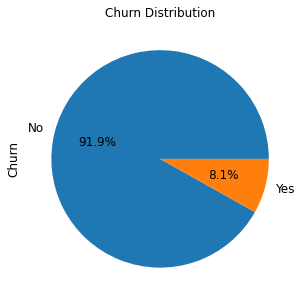

In [ ]:
#Churn Distribution
ax = (df['churn'].value_counts()*100.0 /len(df)).plot.pie(autopct='%.1f%%', labels = ['No', 'Yes'],figsize =(5,5), fontsize = 12 )                                                                           

ax.set_ylabel('Churn',fontsize = 12)
ax.set_title('Churn Distribution', fontsize = 12)

##### Observation: From above result we can see that 91% of the customer do not churn

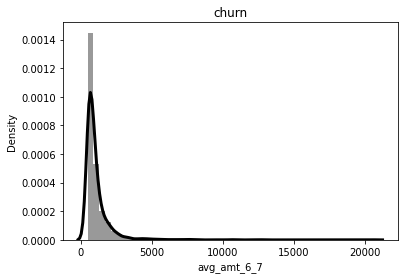

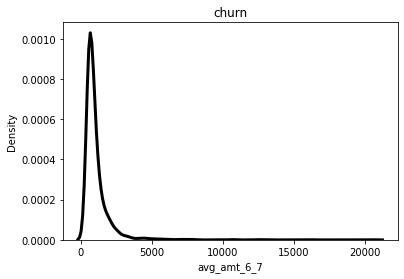

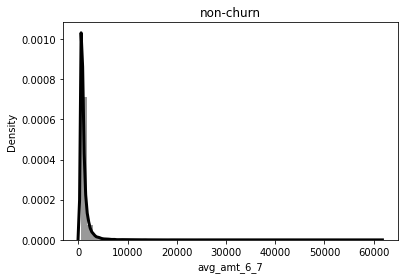

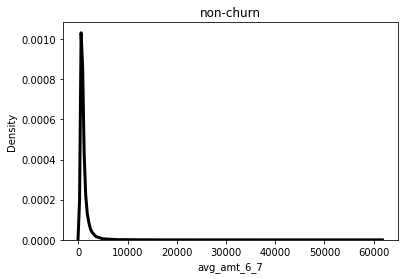

In [ ]:
sns.distplot(df[df.churn == 1].avg_amt_6_7,hist = True,color = 'Black', kde = True, kde_kws = {'linewidth' : 3})
plt.title("churn")
plt.show()
sns.distplot(df[df.churn == 1].avg_amt_6_7,hist = False,color = 'Black', kde = True, kde_kws = {'linewidth' : 3})
plt.title("churn")
plt.show()
sns.distplot(df[df.churn == 0].avg_amt_6_7,hist = True,color = 'Black', kde = True, kde_kws = {'linewidth' : 3})
plt.title("non-churn")
plt.show()
sns.distplot(df[df.churn == 0].avg_amt_6_7,hist = False,color = 'Black', kde = True, kde_kws = {'linewidth' : 3})
plt.title("non-churn")
plt.show()

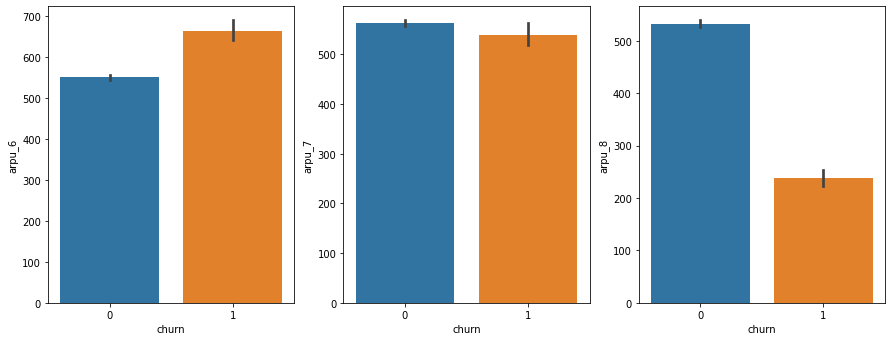

In [ ]:
#Create Bar Plot
plt.figure(figsize=(15,12))
plt.subplot(2,3,1)
sns.barplot(x = 'churn', y = 'arpu_6', data = df)
plt.subplot(2,3,2)
plt.ylabel('Av Rev. Month 7')
sns.barplot(x = 'churn', y = 'arpu_7', data = df)
plt.subplot(2,3,3)
plt.ylabel('Av Rev. Month 8')
sns.barplot(x = 'churn', y = 'arpu_8', data = df)

#### observation : arpu indicate average revenue per user from above graph we can see that average revenue per person decreases in 8th month because of number of churn customer increases.

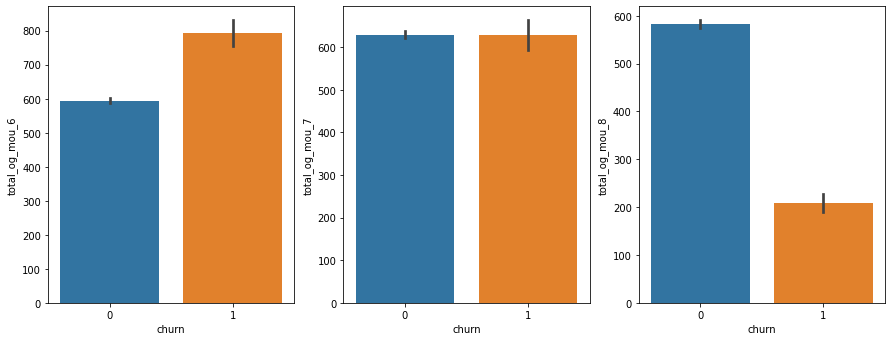

In [ ]:
#Create Bar Plot
plt.figure(figsize=(15, 12))
plt.subplot(2,3,1)
sns.barplot(x = 'churn', y = 'total_og_mou_6', data = df)
plt.subplot(2,3,2)
sns.barplot(x = 'churn', y = 'total_og_mou_7', data = df)
plt.subplot(2,3,3)
sns.barplot(x = 'churn', y = 'total_og_mou_8', data = df)

##### Observation: Total outgoing calls timing in minutes is denoted by total_og_mou as we can observed from above graph that number of outgoing call minutes drop in 8th month it indicates churn.

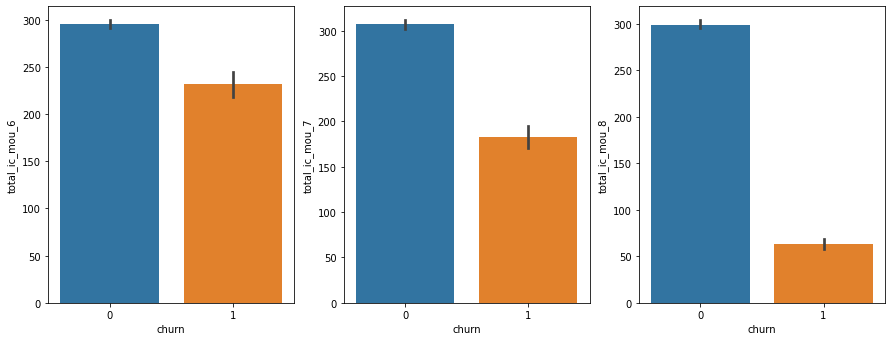

In [ ]:
#Create Bar Plot
plt.figure(figsize=(15, 12))
plt.subplot(2,3,1)
sns.barplot(x = 'churn', y = 'total_ic_mou_6', data = df)
plt.subplot(2,3,2)
sns.barplot(x = 'churn', y = 'total_ic_mou_7', data = df)
plt.subplot(2,3,3)
sns.barplot(x = 'churn', y = 'total_ic_mou_8', data = df)

##### Observation : Total incoming calls timing in minutes is denoted by total_ic_mou as we can observed from above graph that number of incoming call minutes drop in 8th month it indicates churn.

In [ ]:
def dist_box_plot(df,A,B,C):    
    fig, axes = plt.subplots(nrows=1, ncols=4,figsize=(20, 4))
    ax = sns.distplot(df[df['churn']==1][A], bins = 40, ax = axes[0], kde =True,\
                      color='#2980B9',hist_kws={"alpha": 1})
    ax.set_title('Churn',size=20)
    ax = sns.distplot(df[df['churn']==0][A], bins = 40, ax = axes[1], kde = True,\
                     color='#E67E22',hist_kws={"alpha": 1})
    ax.set_title('Non-Churn',size=20)
    ax = sns.distplot(df[df['churn']==1][B], bins = 40, ax = axes[2], kde = True,\
                     color='#2980B9',hist_kws={"alpha": 1})
    ax.set_title('Churn',size=20)
    ax = sns.distplot(df[df['churn']==0][B], bins = 40, ax = axes[3], kde = True,\
                     color='#E67E22',hist_kws={"alpha": 1})
    ax.set_title('Non-Churn',size=20)
    fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(20, 4))
    ax=sns.boxplot(x='churn', y=A, data=df,ax=axes[0])
    ax=sns.stripplot(x='churn', y=A, data=df, jitter=False, edgecolor="gray",ax=axes[0])
    ax.yaxis.label.set_visible(False)
    ax.set_title(A,size=20)
    ax=sns.boxplot(x='churn', y=B, data=df,ax=axes[1])
    ax=sns.stripplot(x='churn', y=B, data=df, jitter=False, edgecolor="gray",ax=axes[1])
    ax.yaxis.label.set_visible(False)
    ax.set_title(B,size=20)
    fig, axes = plt.subplots(nrows=1, ncols=3,figsize=(20, 4))
    ax = sns.distplot(df[df['churn']==1][C], bins = 40, ax = axes[0], kde = False,\
                     color='#2980B9',hist_kws={"alpha": 1})
    ax.set_title('Churn',size=20)
    ax = sns.distplot(df[df['churn']==0][C],bins=40, ax = axes[1], kde = False,\
                     color='#E67E22',hist_kws={"alpha": 1})
    ax.set_title('Non-Churn',size=20)
    ax=sns.boxplot(x='churn', y=C, data=df,ax=axes[2])
    ax=sns.stripplot(x='churn', y=C, data=df, jitter=False, edgecolor="gray",ax=axes[2])
    ax.yaxis.label.set_visible(False)
    ax.set_title(C,fontweight='bold',size=20)
    plt.show()

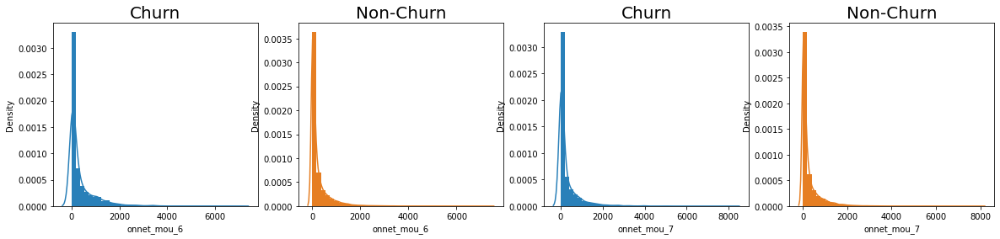

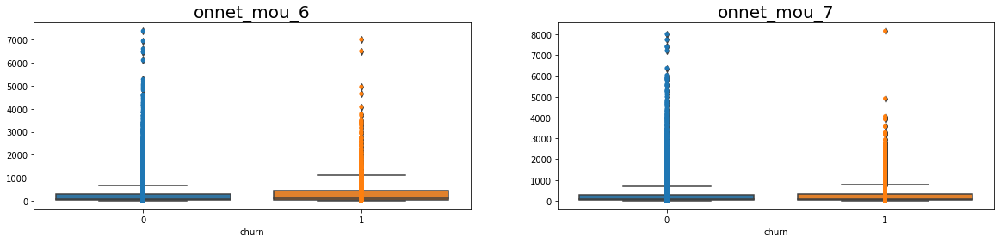

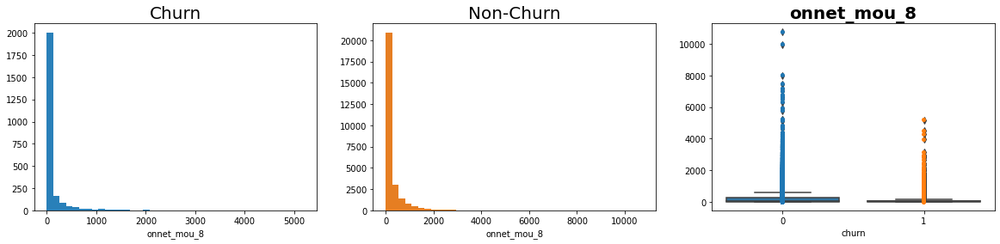

In [ ]:
dist_box_plot(df,'onnet_mou_6','onnet_mou_7','onnet_mou_8')

###### Observation ; From above graphs we can see that all kind of calls within the same operator network for churn have less time usage compared to non-churn.

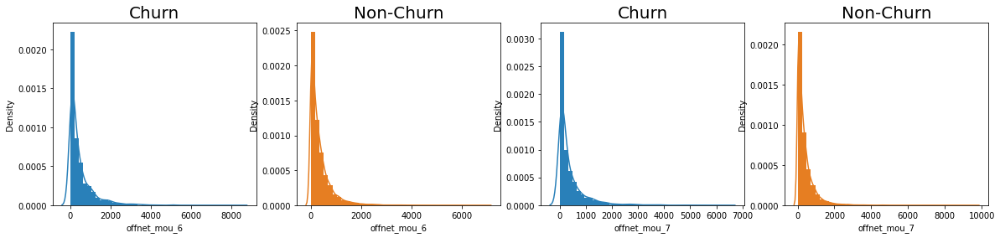

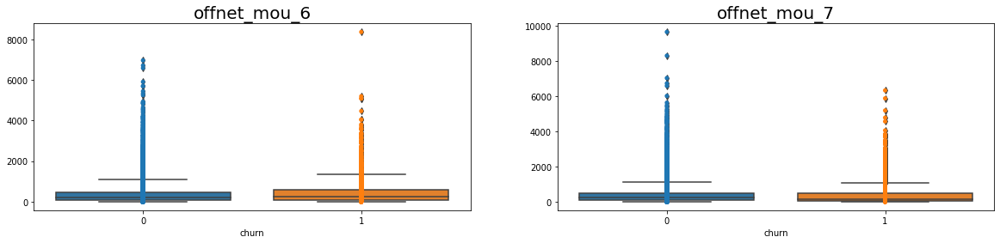

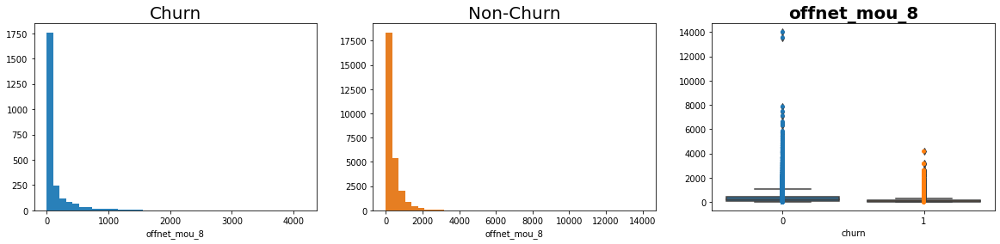

In [ ]:
dist_box_plot(df,'offnet_mou_6','offnet_mou_7','offnet_mou_8')

##### Observation : From above graphs we can see that all kind of calls outside operator T network for churn have less time usage compared to non-churn.

In [ ]:
x25 =df.aon.quantile(0.25)
x50 = df.aon.quantile(0.5)
x75 = df.aon.quantile(0.75)
x100 = df.aon.quantile(1)

def aon(x,x25,x50,x75,x100):
    if(x <= x25):
        return 'low'
    elif ((x > x25) & (x <= x50)):
        return 'medium'
    elif ((x > x50) & (x <= x75)):
        return 'High '
    elif ((x > x75) & (x <= x100)):
        return 'Very High '

df['aon_cat'] = df.aon.apply(lambda x: aon(x,x25,x50,x75,x100))

In [ ]:
def table(col):
    
    '''
    col: Column Name
    '''
    
    crosstb = pd.crosstab(df[col], df['churn'],margins=True)
    crosstb['churn_off percentage'] = round(((100*crosstb.iloc[:,0])/crosstb['All']),3)
    crosstb = crosstb[0:-1]
    return crosstb

In [ ]:
# Lets first create a function so that it will be east to call it for our future analysis.
def bivar(col,stacked= True):
    '''
    col     : Column Name
    stacked : True(default) for Stacked Bar
    '''
    # get dataframe from crosstab function
    plot_crosstb = table(col)
    
    linePlot = plot_crosstb[['churn_off percentage']]      
    barPlot =  plot_crosstb.iloc[:,0:2]
    az = linePlot.plot(figsize=(5,3), marker='o',color = 'b')
    az2 = barPlot.plot(kind='bar',ax = az,rot=1,secondary_y=True,stacked=stacked)
    az.set_title(df[col].name.title()+' vs churn off percentage',fontsize=20,weight="bold")
    az.set_xticklabels(az.get_xticklabels(), rotation=30, ha="right")
    az.set_xlabel(df[col].name.title(),fontsize=14)
    az.set_ylabel('churn off percentage',color = 'b',fontsize=14)
    az2.set_ylabel('customers Count',color = 'r',fontsize=14)
    az2.set_xticklabels(az.get_xticklabels(), rotation=30, ha="right")
    plt.show()

churn,0,1,All,churn_off percentage
last_day_rch_amt_6,,,,
153.0,2,0,2,100.000
75.0,3,0,3,100.000
330.0,23,0,23,100.000
325.0,35,0,35,100.000
297.0,3,0,3,100.000
274.0,30,0,30,100.000
269.0,1,0,1,100.000
236.0,1,0,1,100.000
230.0,1,0,1,100.000


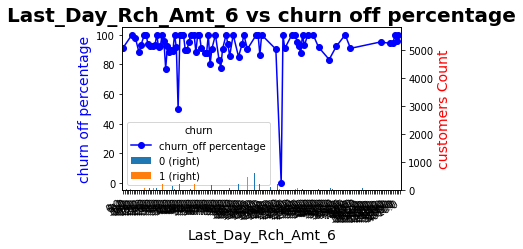

churn,0,1,All,churn_off percentage
last_day_rch_amt_7,,,,
4010.0,1,0,1,100.000
440.0,9,0,9,100.000
108.0,1,0,1,100.000
107.0,1,0,1,100.000
102.0,18,0,18,100.000
101.0,2,0,2,100.000
405.0,1,0,1,100.000
97.0,3,0,3,100.000
95.0,7,0,7,100.000


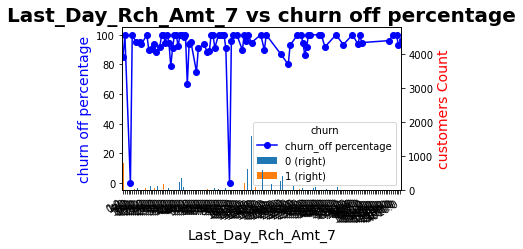

churn,0,1,All,churn_off percentage
last_day_rch_amt_8,,,,
153.0,1,0,1,100.000
254.0,2,0,2,100.000
195.0,7,0,7,100.000
202.0,27,0,27,100.000
209.0,1,0,1,100.000
215.0,15,0,15,100.000
225.0,16,0,16,100.000
248.0,15,0,15,100.000
297.0,6,0,6,100.000


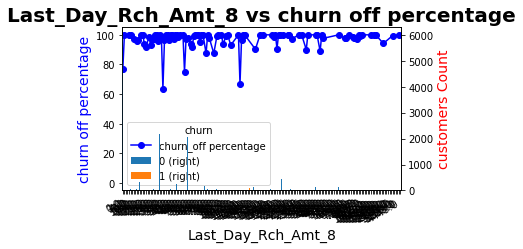

In [ ]:
# lets call the our functions table and bivar to plot graphs 
x = table('last_day_rch_amt_6')

# Displaying the output in descending order based on the 'Churn_off percentage' column
display(x.sort_values('churn_off percentage', ascending= False))

# lets plot the graphs using the function 'bivar' that we have created
bivar(col ='last_day_rch_amt_6',stacked=False) 
y = table('last_day_rch_amt_7')

# Displaying the output in descending order based on the 'churn_off percentage' column
display(y.sort_values('churn_off percentage', ascending= False))

# lets plot the graphs using the function 'bivar' that we have created
bivar(col ='last_day_rch_amt_7',stacked=False) 
z = table('last_day_rch_amt_8')

# Displaying the output in descending order based on the 'churn_off percentage' column
display(z.sort_values('churn_off percentage', ascending= False))

# lets plot the graphs using the function 'bivar' that we have created
bivar(col ='last_day_rch_amt_8',stacked=False) 



churn,0,1,All,churn_off percentage
aon_cat,,,,
Very High,7219,280,7499,96.266
High,6950,550,7500,92.667
medium,6768,720,7488,90.385
low,6623,891,7514,88.142


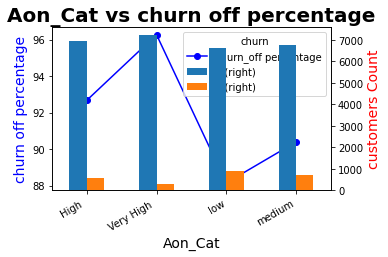

In [ ]:
# lets call the our functions table and bivar to plot graphs 
x = table('aon_cat')

# Displaying the output in descending order based on the 'Churn_off percentage' column
display(x.sort_values('churn_off percentage', ascending= False))

# lets plot the graphs using the function 'bivar' that we have created
bivar(col ='aon_cat',stacked=False) 

Text(0.5, 1.0, 'Customers by their tenure')

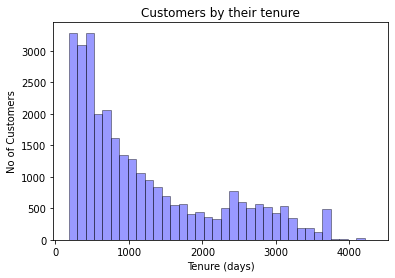

In [ ]:
ax = sns.distplot(df['aon'], hist=True, kde=False, 
             bins=int(180/5), color = 'blue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4})
ax.set_ylabel('No of Customers')
ax.set_xlabel('Tenure (days)')
ax.set_title('Customers by their tenure')

##### Observation : most of customer prefer tenture of 600-800 days tenture.

Text(0.5, 1.0, 'Customers by their amount')

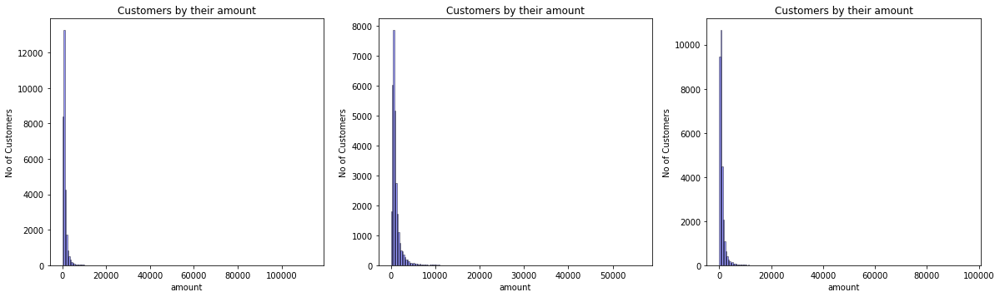

In [ ]:
plt.figure(figsize=(20,12))
plt.subplot(2,3,1)
ax = sns.distplot(df['amt_data_6'], hist=True, kde=False, 
             bins=int(200), color = 'blue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 5})
ax.set_ylabel('No of Customers')
ax.set_xlabel('amount')
ax.set_title('Customers by their amount')
plt.subplot(2,3,2)
bx = sns.distplot(df['amt_data_7'], hist=True, kde=False, 
             bins=int(200), color = 'blue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 5})
bx.set_ylabel('No of Customers')
bx.set_xlabel('amount')
bx.set_title('Customers by their amount')
plt.subplot(2,3,3)
cx = sns.distplot(df['amt_data_8'], hist=True, kde=False, 
             bins=int(200), color = 'blue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 5})
cx.set_ylabel('No of Customers')
cx.set_xlabel('amount')
cx.set_title('Customers by their amount')



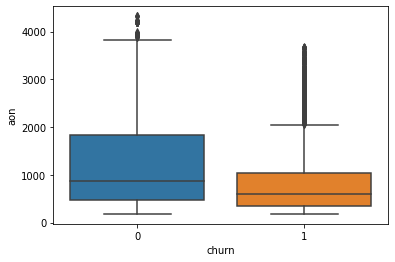

In [ ]:
sns.boxplot(x = df.churn, y = df.aon)

##### Observation : on indicates Age on network - number of days the customer is using the operator T network. ```

##### when the age on network span is high then chances of churn is less.

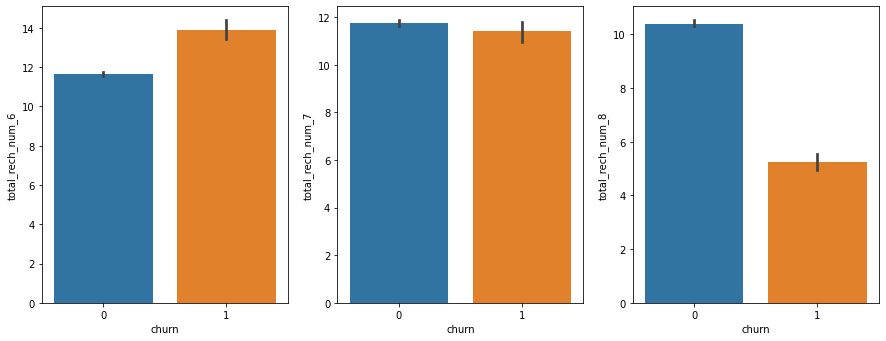

In [ ]:
plt.figure(figsize=(15, 12))
plt.subplot(2,3,1)
sns.barplot(x = df.churn, y = df.total_rech_num_6)
plt.subplot(2,3,2)

sns.barplot(x = df.churn, y = df.total_rech_num_7)
plt.subplot(2,3,3)
sns.barplot(x = df.churn, y = df.total_rech_num_8)


##### Observation : Significant drop in total recharge numbers in 8th month for churn customers.

In [ ]:
recharge_data = df.loc[:,df.columns.str.contains('rech')]
tot_data = df.loc[:,df.columns.str.contains('tot')]
amount_data = df.loc[:,df.columns.str.contains('amt')]
ic_mou_data = df.loc[:,(df.columns.str.contains('ic') & df.columns.str.contains('mou'))]
og_mou_data = df.loc[:,(df.columns.str.contains('og') & df.columns.str.contains('mou'))]
net_mou_data = df.loc[:,df.columns.str.contains('net_mou')]
data3g = df.loc[:,(df.columns.str.contains('3g'))]
data2g = df.loc[:,(df.columns.str.contains('2g'))]

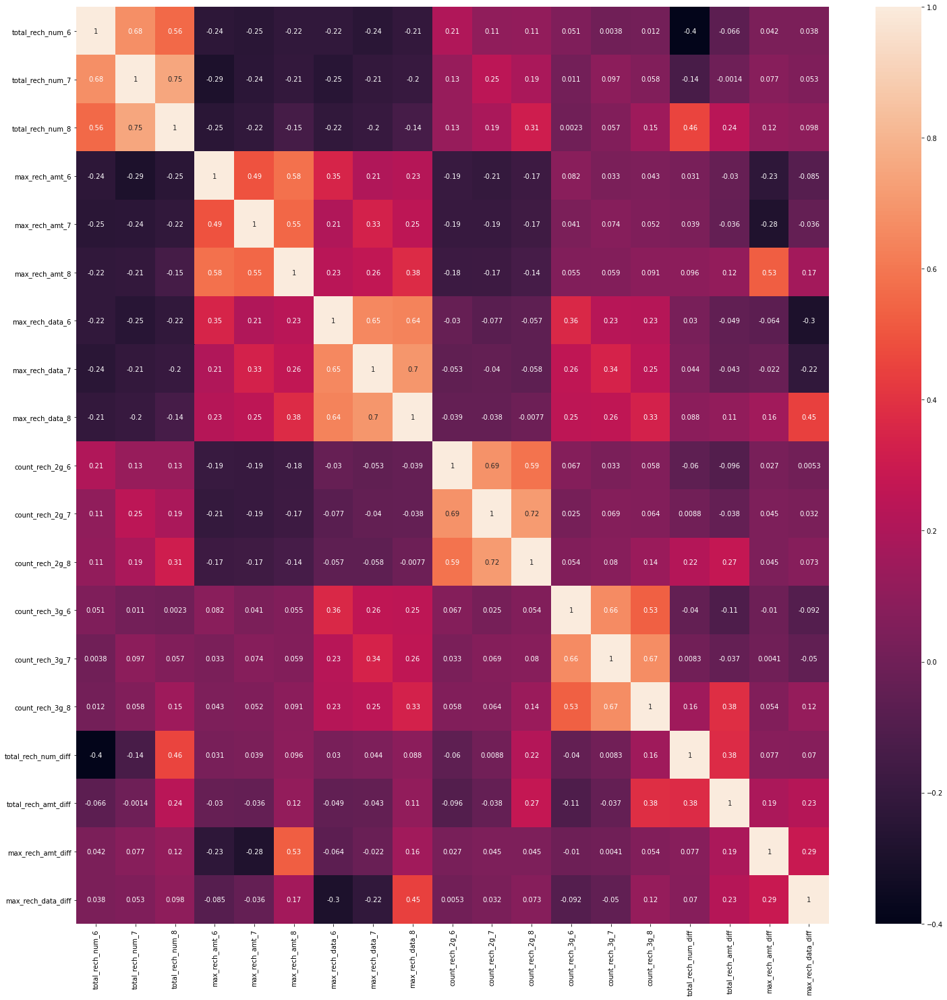

In [ ]:
#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (25,25))
sns.heatmap(recharge_data.corr(),annot = True)

##### Observation :
- High correlation between Average Recharge Amount and Rechage amounts for 6 and 7 
- It is expected as the recharge amount is calculated for purpose of filtering high value customers.

- There is high correlation 75% between data recharge for month 7 and recharge for month 8.

- Any factor that has correlation with month 8 is probably correlated to the churn prediction.

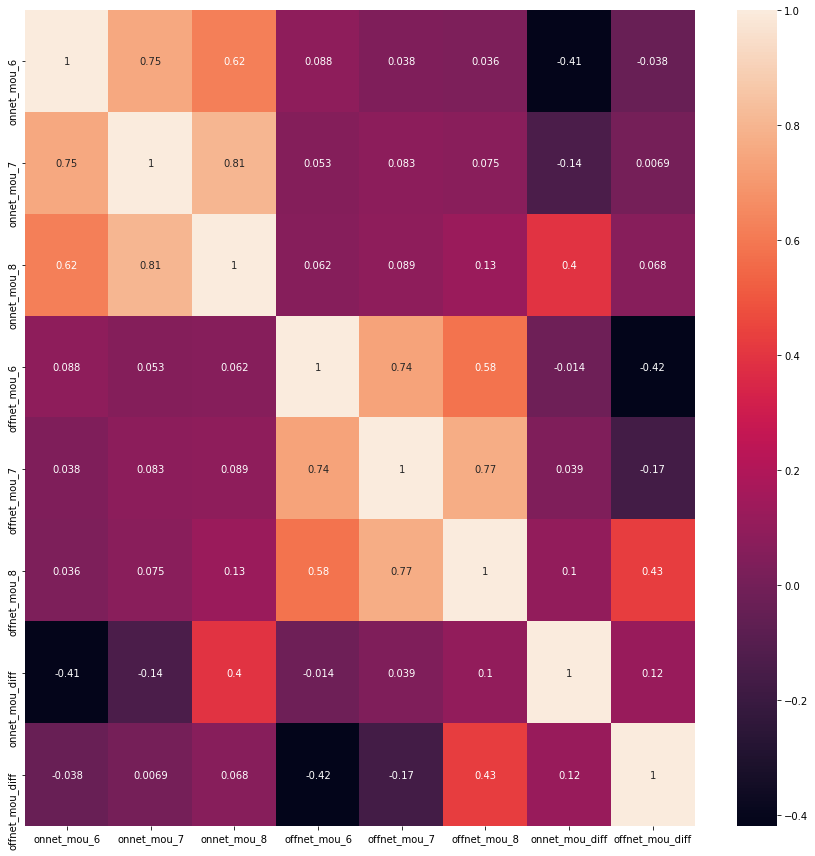

In [ ]:
#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (15,15))
sns.heatmap(net_mou_data.corr(),annot = True)

###### Observation :
- No Correlation between ONNET and OFFNET Minutes of usage

- High correlation between months 7 and 8 both for ONNET and OFFNET usage

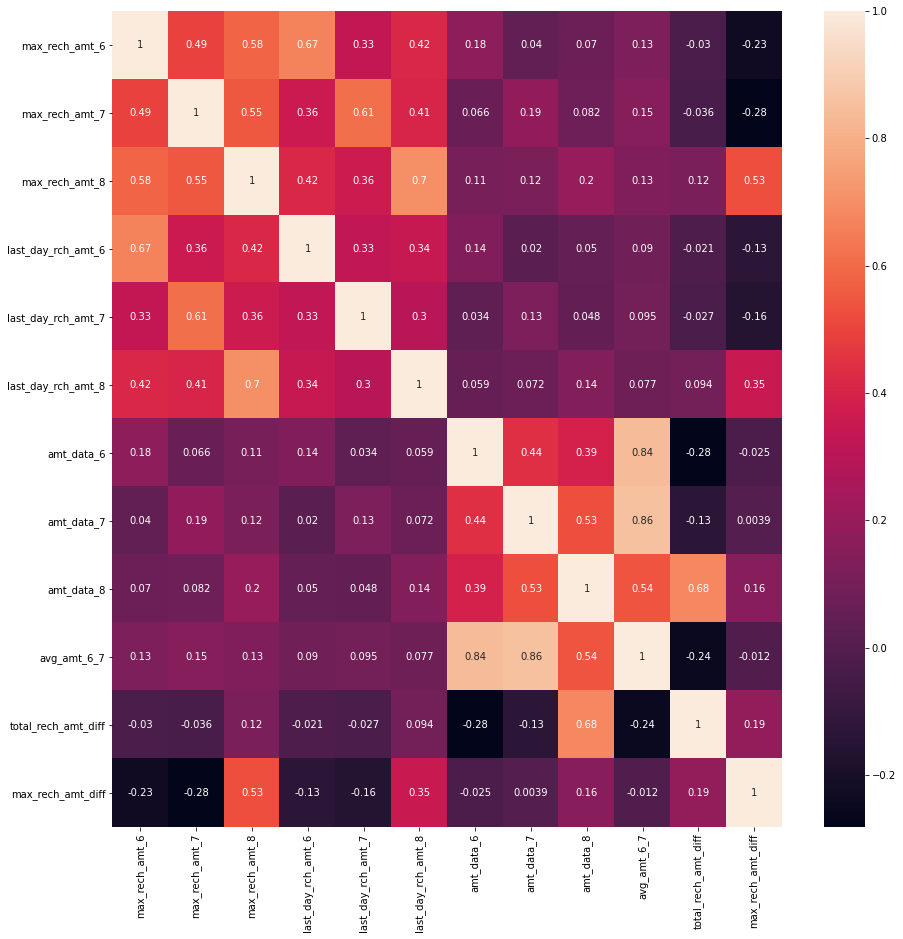

In [ ]:
#plotting the correlation matrix
%matplotlib inline
plt.figure(figsize = (15,15))
sns.heatmap(amount_data.corr(),annot = True)

##### Observation : 
- There is higher correlation between the Max Recharge Amount in month 8 and the Last Day Recharge Amount

- This could indicate that if a customer is not going to Churn then they Recharge for a higher amount in month 8

Text(0.5, 1.0, 'Distribution of Max Recharge Amount by churn')

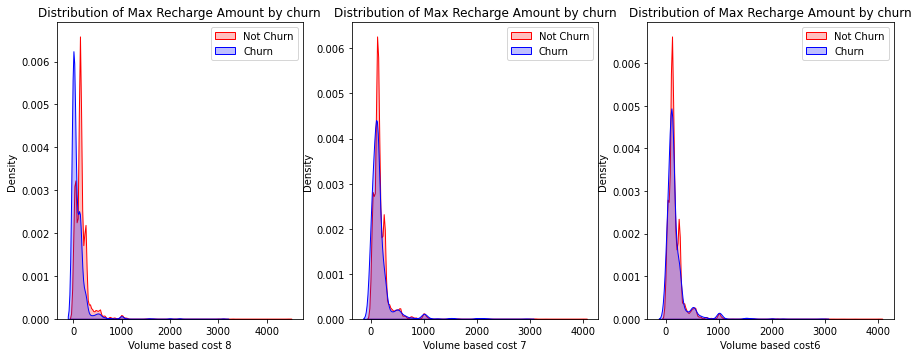

In [ ]:
plt.figure(figsize=(15,12))
plt.subplot(2,3,1)
ax = sns.kdeplot(df.max_rech_amt_8[(df["churn"] == 0)],
                color="Red", shade = True)
ax = sns.kdeplot(df.max_rech_amt_8[(df["churn"] == 1)],
                ax =ax, color="Blue", shade= True)

ax.legend(["Not Churn","Churn"],loc='upper right')
ax.set_ylabel('Density')
ax.set_xlabel('Volume based cost 8')
ax.set_title('Distribution of Max Recharge Amount by churn')
plt.subplot(2,3,2)
bx = sns.kdeplot(df.max_rech_amt_7[(df["churn"] == 0)],
                color="Red", shade = True)
bx = sns.kdeplot(df.max_rech_amt_7[(df["churn"] == 1)],
                color="Blue", shade= True)
bx.legend(["Not Churn","Churn"],loc='upper right')
bx.set_ylabel('Density')
bx.set_xlabel('Volume based cost 7')
bx.set_title('Distribution of Max Recharge Amount by churn')
plt.subplot(2,3,3)
cx = sns.kdeplot(df.max_rech_amt_6[(df["churn"] == 0)],
                color="Red", shade = True)
cx = sns.kdeplot(df.max_rech_amt_6[(df["churn"] == 1)],
                color="Blue", shade= True)
cx.legend(["Not Churn","Churn"],loc='upper right')
cx.set_ylabel('Density')
cx.set_xlabel('Volume based cost6')
cx.set_title('Distribution of Max Recharge Amount by churn')


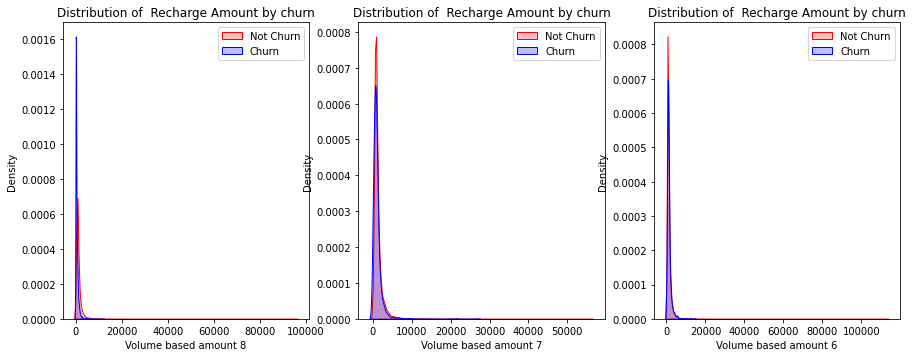

In [ ]:
plt.figure(figsize=(15,12))
plt.subplot(2,3,1)
ax = sns.kdeplot(df.amt_data_8[(df["churn"] == 0)],
                color="Red", shade = True)
ax = sns.kdeplot(df.amt_data_8[(df["churn"] == 1)],
                ax =ax, color="Blue", shade= True)

ax.legend(["Not Churn","Churn"],loc='upper right')
ax.set_ylabel('Density')
ax.set_xlabel('Volume based amount 8')
ax.set_title('Distribution of  Recharge Amount by churn')
plt.subplot(2,3,2)
bx = sns.kdeplot(df.amt_data_7[(df["churn"] == 0)],
                color="Red", shade = True)
bx = sns.kdeplot(df.amt_data_7[(df["churn"] == 1)],
                color="Blue", shade= True)
bx.legend(["Not Churn","Churn"],loc='upper right')
bx.set_ylabel('Density')
bx.set_xlabel('Volume based amount 7')
bx.set_title('Distribution of  Recharge Amount by churn')
plt.subplot(2,3,3)
cx = sns.kdeplot(df.amt_data_6[(df["churn"] == 0)],
                color="Red", shade = True)
cx = sns.kdeplot(df.amt_data_6[(df["churn"] == 1)],
                color="Blue", shade= True)
cx.legend(["Not Churn","Churn"],loc='upper right')
cx.set_ylabel('Density')
cx.set_xlabel('Volume based amount 6')
cx.set_title('Distribution of  Recharge Amount by churn')
df.drop('aon_cat',inplace = True, axis = 1)

##### Observation : From above graph we can see that churn density is higher in 8th month.

## Modeling

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from imblearn.metrics import sensitivity_specificity_support
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import plot_roc_curve
from imblearn.combine import SMOTETomek
from sklearn.feature_selection import RFE
import statsmodels.api as sm
from IPython.display import Image  
from io import StringIO
from sklearn.tree import export_graphviz
import pydotplus, graphviz
import xgboost as xgb

## Step 2: Preparing the Data for Modeling (test-train, rescaling etc)

In [ ]:
df_train, df_test = train_test_split(df, random_state = 100, train_size = 0.7, test_size = 0.3)

In [ ]:
y_train = df_train.pop('churn')
X_train = df_train

In [ ]:
y_test = df_test.pop('churn')
X_test = df_test

### Feature Scaling

In [ ]:
scaler = StandardScaler()
cols  = list(X_train.columns)
X_train[cols] = scaler.fit_transform(X_train[cols])
X_test[cols] = scaler.transform(X_test[cols])

In [ ]:
X_train

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,amt_data_6,amt_data_7,amt_data_8,avg_amt_6_7,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,total_og_mou_diff,loc_ic_mou_diff,std_ic_mou_diff,isd_ic_mou_diff,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,max_rech_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
39186,1.115484,0.688737,0.152667,-0.559312,-0.543098,-0.501847,-0.466187,-0.442957,-0.498493,0.166015,0.177751,0.252122,-0.178395,-0.062395,-0.095051,-0.348812,-0.324844,-0.318853,-0.565943,-0.549298,-0.569585,-0.227853,-0.290731,-0.304296,-0.254831,0.482122,-0.077536,-0.600265,-0.580504,-0.582545,-0.411127,-0.413976,-0.373254,-0.433608,-0.407852,-0.350906,-0.156374,-0.141659,-0.143638,-0.567690,-0.550899,-0.481454,2.238915,1.762919,0.997135,-0.326117,0.065368,-0.272720,-0.140957,-0.01516,-0.016828,-0.665728,-0.661873,-0.650555,-0.307478,-0.189593,-0.106247,-0.085248,-0.059517,-0.202093,-0.178038,-0.128034,-0.280444,-0.244727,-0.161955,-0.238383,-0.184858,-0.179917,-0.191835,-0.117708,0.019601,0.279223,-0.135600,-0.136123,-0.124243,-0.208529,-0.107943,0.091271,0.378162,0.154991,-0.037517,-0.308577,-0.13577,-0.234992,3.273325,1.628862,0.689833,-0.074812,0.027293,-0.088662,-0.415802,-0.717597,-0.751786,1.293454,1.573734,0.391372,2.047579,-0.456642,0.716280,-0.694135,-0.700252,-0.656217,-0.493257,-0.511751,-0.476808,-0.367574,-0.356341,-0.324914,-0.388365,-0.375952,-0.337356,-0.364613,-0.394511,-0.373871,-1.099871,-1.123998,-1.048154,-0.401189,-0.408175,-0.376513,-0.423358,-0.442850,-0.416085,-0.360796,-0.34396,-0.343262,-0.211037,-0.207517,-0.184095,-1.106005,-1.127047,-1.042887,2.582178,-0.401980,-0.400504,-0.382233,-0.150690,0.269632,-0.184180,-0.209215,0.024772,-1.064115,0.086809,-0.049886,0.080469,0.038163,0.049653,0.125405,-3.811874,-0.176005,0.016816,-0.048298,0.369669,-2.380394,0.079686,-0.503139,-0.251672,-0.268155,-1.353429,0.082294,0.075307,0.005831
39833,-0.096775,-0.500253,-0.275833,-0.253700,-0.456323,-0.

In [ ]:
X_test

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,amt_data_6,amt_data_7,amt_data_8,avg_amt_6_7,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,total_og_mou_diff,loc_ic_mou_diff,std_ic_mou_diff,isd_ic_mou_diff,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,max_rech_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
20296,-0.042018,-0.051478,-0.431655,-0.536874,-0.548881,-0.494992,-0.669763,-0.729433,-0.655378,-0.211944,-0.168046,-0.169673,-0.232413,-0.211540,-0.192132,-0.357017,-0.341987,-0.305308,-0.474079,-0.656913,-0.594471,-0.122882,-0.222788,-0.216853,-0.250072,-0.199179,-0.224949,-0.537796,-0.656793,-0.585189,-0.380142,-0.408487,-0.373254,-0.428534,-0.412334,-0.369150,-0.074142,-0.141659,-0.063738,-0.542048,-0.550370,-0.492240,-0.044048,-0.04386,-0.040774,-0.255155,-0.167790,-0.172815,-0.140957,-0.015160,-0.016828,-0.782179,-0.840911,-0.734983,-0.348665,-0.369500,-0.374652,-0.452269,-0.544663,-0.591123,-0.143525,-0.010025,0.197024,-0.519222,-0.578576,-0.583568,0.172048,-0.179917,-0.191835,-0.211444,-0.279837,-0.229817,0.130117,-0.136123,-0.124243,-0.035016,-0.316935,-0.287802,-0.487459,-0.645839,-0.630710,-0.308577,-0.135770,-0.234992,-0.138443,-0.150237,-0.159451,-0.074812,-0.086475,-0.088662,0.017540,-0.080537,-0.643976,-0.284615,-0.123992,-0.095029,-0.492729,0.336648,0.340926,-0.694135,-0.700252,-0.656217,-0.493257,-0.511751,-0.476808,-0.367574,-0.356341,-0.324914,-0.388365,-0.375952,-0.337356,-0.364613,-0.394511,-0.373871,-1.099871,-1.123998,-1.048154,-0.401189,-0.408175,-0.376513,-0.423358,-0.442850,-0.416085,-0.360796,-0.343960,-0.343262,-0.211037,-0.207517,-0.184095,-1.106005,-1.127047,-1.042887,-0.559188,-0.401980,-0.400504,-0.382233,-0.15069,-0.288380,-0.271193,-0.397586,-0.320980,-0.620279,0.084947,0.080613,0.031141,0.042499,0.056775,0.091181,0.014211,0.039185,0.106765,-0.029569,-0.152748,0.010327,0.079686,-0.077376,-0.852688,-0.204280,0.141591,0.082294,0.075307,0.005831
8279,-1.014833,-0.705605,-0.810840,-0.53

Smote: For dealing with Data Imblance 

In [ ]:
def Counter(y1,y2):
    print("Before OverSampling, counts of label '1': {}".format(sum(y1==1)))
    print("Before OverSampling, counts of label '0': {} \n".format(sum(y1==0)))
    print("After OverSampling, counts of label '1': {}".format(sum(y2==1)))
    print("After OverSampling, counts of label '0': {}".format(sum(y2==0)))

In [ ]:
smtom = SMOTETomek(random_state=100)
X_train_smtom, y_train_smtom = smtom.fit_resample(X_train,y_train)

Counter(y_train,y_train_smtom)


Before OverSampling, counts of label '1': 1691
Before OverSampling, counts of label '0': 19309 

After OverSampling, counts of label '1': 19302
After OverSampling, counts of label '0': 19302


In [ ]:
X_train_new = pd.DataFrame(X_train_smtom,columns=X_train.columns)
X_train_new.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,amt_data_6,amt_data_7,amt_data_8,avg_amt_6_7,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,total_og_mou_diff,loc_ic_mou_diff,std_ic_mou_diff,isd_ic_mou_diff,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,max_rech_data_diff,vol_2g_mb_diff,vol_3g_mb_diff
0,1.115484,0.688737,0.152667,-0.559312,-0.543098,-0.501847,-0.466187,-0.442957,-0.498493,0.166015,0.177751,0.252122,-0.178395,-0.062395,-0.095051,-0.348812,-0.324844,-0.318853,-0.565943,-0.549298,-0.569585,-0.227853,-0.290731,-0.304296,-0.254831,0.482122,-0.077536,-0.600265,-0.580504,-0.582545,-0.411127,-0.413976,-0.373254,-0.433608,-0.407852,-0.350906,-0.156374,-0.141659,-0.143638,-0.567690,-0.550899,-0.481454,2.238915,1.762919,0.997135,-0.326117,0.065368,-0.272720,-0.140957,-0.01516,-0.016828,-0.665728,-0.661873,-0.650555,-0.307478,-0.189593,-0.106247,-0.085248,-0.059517,-0.202093,-0.178038,-0.128034,-0.280444,-0.244727,-0.161955,-0.238383,-0.184858,-0.179917,-0.191835,-0.117708,0.019601,0.279223,-0.135600,-0.136123,-0.124243,-0.208529,-0.107943,0.091271,0.378162,0.154991,-0.037517,-0.308577,-0.13577,-0.234992,3.273325,1.628862,0.689833,-0.074812,0.027293,-0.088662,-0.415802,-0.717597,-0.751786,1.293454,1.573734,0.391372,2.047579,-0.456642,0.716280,-0.694135,-0.700252,-0.656217,-0.493257,-0.511751,-0.476808,-0.367574,-0.356341,-0.324914,-0.388365,-0.375952,-0.337356,-0.364613,-0.394511,-0.373871,-1.099871,-1.123998,-1.048154,-0.401189,-0.408175,-0.376513,-0.423358,-0.442850,-0.416085,-0.360796,-0.34396,-0.343262,-0.211037,-0.207517,-0.184095,-1.106005,-1.127047,-1.042887,2.582178,-0.401980,-0.400504,-0.382233,-0.15069,0.269632,-0.184180,-0.209215,0.024772,-1.064115,0.086809,-0.049886,0.080469,0.038163,0.049653,0.125405,-3.811874,-0.176005,0.016816,-0.048298,0.369669,-2.380394,0.079686,-0.503139,-0.251672,-0.268155,-1.353429,0.082294,0.075307,0.005831
1,-0.096775,-0.500253,-0.275833,-0.253700,-0.456323,-0.423795,-0

In [ ]:
y_train_new = y_train_smtom.reshape(-1,1)
print(y_train_new.shape)

(38604, 1)


In [ ]:
def performance_metrics(model,y_test,y_pred,y_pred_prob):
    sensitivity,specificity,_ = sensitivity_specificity_support(y_test,y_pred,average='binary')
    precision = metrics.precision_score(y_test,y_pred)
    recall = metrics.recall_score(y_test,y_pred)
    f1_score = metrics.f1_score(y_test,y_pred)
    roc_auc_score = metrics.roc_auc_score(y_test,y_pred_prob[:,1])
    accuracy = metrics.accuracy_score(y_test,y_pred)
    return pd.DataFrame({'Model':[model],'Sensitivity': [sensitivity],'Specificity':[specificity],'Precision':[precision],
                         'Recall':[recall],'F1_Score':[f1_score],'ROC_AUC':[roc_auc_score],'Accuracy': [accuracy]})
  
Final_Model = pd.DataFrame({'Model':[None],'Sensitivity': [None],'Specificity': [None],'Precision':[None],
                         'Recall':[None],'F1_Score':[None],'ROC_AUC': [None],'Accuracy': [None]})

Final_Model = Final_Model.dropna()

In [ ]:
X_train_new.to_csv('/content/drive/MyDrive/Telecom Churn Case Study/X_train_new.csv')

## Step 3 : Training and Testing Different Models

## Model 1

## Regularized Logistic Regression (L2 Regularization)

In [ ]:
logreg = LogisticRegression()
rfe = RFE(logreg,50)
rfe = rfe.fit(X_train_new,y_train_new)

In [ ]:
list(zip(X_train_new.columns, rfe.support_ , rfe.ranking_))

[('arpu_6', False, 37),
 ('arpu_7', False, 10),
 ('arpu_8', True, 1),
 ('onnet_mou_6', True, 1),
 ('onnet_mou_7', True, 1),
 ('onnet_mou_8', True, 1),
 ('offnet_mou_6', True, 1),
 ('offnet_mou_7', False, 96),
 ('offnet_mou_8', True, 1),
 ('roam_ic_mou_6', False, 83),
 ('roam_ic_mou_7', False, 62),
 ('roam_ic_mou_8', False, 100),
 ('roam_og_mou_6', True, 1),
 ('roam_og_mou_7', False, 33),
 ('roam_og_mou_8', False, 32),
 ('loc_og_t2t_mou_6', False, 85),
 ('loc_og_t2t_mou_7', False, 12),
 ('loc_og_t2t_mou_8', False, 56),
 ('loc_og_t2m_mou_6', False, 14),
 ('loc_og_t2m_mou_7', False, 50),
 ('loc_og_t2m_mou_8', False, 52),
 ('loc_og_t2f_mou_6', False, 86),
 ('loc_og_t2f_mou_7', False, 79),
 ('loc_og_t2f_mou_8', False, 111),
 ('loc_og_t2c_mou_6', False, 40),
 ('loc_og_t2c_mou_7', False, 59),
 ('loc_og_t2c_mou_8', False, 58),
 ('loc_og_mou_6', False, 53),
 ('loc_og_mou_7', False, 54),
 ('loc_og_mou_8', False, 78),
 ('std_og_t2t_mou_6', False, 39),
 ('std_og_t2t_mou_7', False, 4),
 ('std_og_t2

In [ ]:
rfe_cols = list(X_train_new.columns[rfe.support_])
rfe_cols

['arpu_8',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'offnet_mou_6',
 'offnet_mou_8',
 'roam_og_mou_6',
 'std_og_t2m_mou_7',
 'std_og_mou_6',
 'total_og_mou_6',
 'total_og_mou_7',
 'total_og_mou_8',
 'loc_ic_t2t_mou_6',
 'loc_ic_t2t_mou_8',
 'loc_ic_t2m_mou_6',
 'loc_ic_t2m_mou_8',
 'loc_ic_mou_6',
 'loc_ic_mou_7',
 'loc_ic_mou_8',
 'std_ic_t2t_mou_6',
 'std_ic_t2m_mou_8',
 'std_ic_mou_6',
 'std_ic_mou_7',
 'std_ic_mou_8',
 'total_ic_mou_6',
 'total_ic_mou_7',
 'total_ic_mou_8',
 'isd_ic_mou_6',
 'isd_ic_mou_7',
 'isd_ic_mou_8',
 'ic_others_7',
 'ic_others_8',
 'max_rech_amt_8',
 'last_day_rch_amt_8',
 'max_rech_data_8',
 'count_rech_2g_8',
 'vol_2g_mb_6',
 'sachet_2g_8',
 'sep_vbc_3g',
 'amt_data_8',
 'onnet_mou_diff',
 'offnet_mou_diff',
 'roam_og_mou_diff',
 'std_og_mou_diff',
 'total_og_mou_diff',
 'loc_ic_mou_diff',
 'std_ic_mou_diff',
 'isd_ic_mou_diff',
 'total_ic_mou_diff',
 'vol_2g_mb_diff']

In [ ]:
X_train_new_rfe = X_train_new[rfe_cols]

In [ ]:
params = {"C":[10000,2000,1000,100,10,1,0.1,0.01,0.02,0.03,0.04,0.05,0.06]}

folds = 5

estimator = LogisticRegression()

model_logreg_cv = GridSearchCV(estimator=estimator,param_grid=params,scoring='roc_auc',
                               cv= folds,verbose = 1,n_jobs=-1)

model_logreg_cv.fit(X_train_new_rfe,y_train_new)

Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   20.3s
[Parallel(n_jobs=-1)]: Done  65 out of  65 | elapsed:   28.4s finished


GridSearchCV(cv=5, error_score=nan,
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='auto',
                                          n_jobs=None, penalty='l2',
                                          random_state=None, solver='lbfgs',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='deprecated', n_jobs=-1,
             param_grid={'C': [10000, 2000, 1000, 100, 10, 1, 0.1, 0.01, 0.02,
                               0.03, 0.04, 0.05, 0.06]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='roc_auc', verbose=1)

In [ ]:
model_logreg_cv.best_score_

0.9236480609531096

In [ ]:
model_logreg_cv.best_estimator_

LogisticRegression(C=10000, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
model_logreg_cv.best_params_

{'C': 10000}

In [ ]:
cv_results = pd.DataFrame(model_logreg_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.900435,0.039390,0.007317,0.000332,10000,{'C': 10000},0.914132,0.924325,0.927277,0.927726,0.924780,0.923648,0.004941,1
1,0.839684,0.024149,0.007997,0.001481,2000,{'C': 2000},0.914163,0.924357,0.927250,0.927688,0.924746,0.923641,0.004919,3
2,0.814563,0.007818,0.007190,0.000121,1000,{'C': 1000},0.914107,0.924346,0.927283,0.927684,0.924754,0.923635,0.004944,4
3,0.829392,0.009117,0.007893,0.001157,100,{'C': 100},0.914131,0.924359,0.927281,0.927697,0.924762,0.923646,0.004938,2
4,0.857997,0.025786,0.009599,0.002990,10,{'C': 10},0.914159,0.924296,0.927275,0.927651,0.924656,0.923608,0.004912,5
5,0.898988,0.013091,0.007645,0.000208,1,{'C': 1},0.913879,0.924215,0.926918,0.927337,0.924313,0.923332,0.004899,6
6,0.867549,0.033382,0.007360,0.000177,0.1,{'C': 0.1},0.912066,0.922426,0.925255,0.924663,0.921305,0.921143,0.004761,7
7,0.486129,0.033885,0.007088,0.000173,0.01,{'C': 0.01},0.901049,0.910118,0.914244,0.911834,0.908089,0.909067,0.004490,13
8,0.650673,0.019900,0.007371,0.000263,0.02,{'C': 0.02},0.905891,0.915525,0.919189,0.917169,0.913458,0.914246,0.004583,12
9,0.748582,0.040808,0.007410,0.000334,0.03,{'C': 0.03},0.908092,0.918049,0.921547,0.919755,0.916096,0.916708,0.004671,11


In [ ]:
LR_classifier = LogisticRegression(penalty='l2',C=2000,n_jobs = -1,random_state = 42)

In [ ]:
LR_classifier.fit(X_train_new_rfe,y_train_new)

LogisticRegression(C=2000, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=-1, penalty='l2', random_state=42,
                   solver='lbfgs', tol=0.0001, verbose=0, warm_start=False)

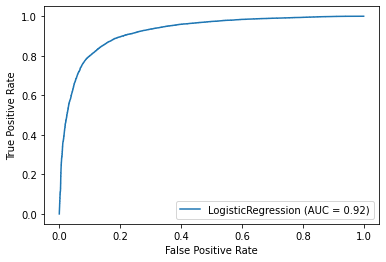

In [ ]:
plot_roc_curve(LR_classifier, X_train_new_rfe,y_train_new, drop_intermediate=False)
plt.show()

In [ ]:
coef = LR_classifier.coef_
abs_coef = abs(LR_classifier.coef_)
features = list(X_train_new_rfe.columns)
important_features = pd.DataFrame({'Features':features,'Coeff':list(coef[0]),'Abs_Coeff':list(abs_coef[0])})
important_features = important_features.sort_values('Abs_Coeff',ascending=False).reset_index(drop=True)
important_features

,Features,Coeff,Abs_Coeff
0,total_ic_mou_8,-6.063997,6.063997
1,total_ic_mou_6,-4.762690,4.762690
2,total_ic_mou_diff,-3.889520,3.889520
3,loc_ic_mou_8,3.816879,3.816879
4,total_og_mou_8,-3.575421,3.575421
5,total_og_mou_6,-3.184994,3.184994
6,loc_ic_mou_6,2.624234,2.624234
7,loc_ic_mou_diff,2.400581,2.400581
8,total_og_mou_diff,-2.385179,2.385179
9,total_ic_mou_7,-2.371942,2.371942


In [ ]:
print(abs(LR_classifier.coef_))
print(coef)

[[0.33753031 1.6029679  0.7883322  1.70730769 1.2853811  2.2288075
  0.59435798 0.52565835 0.86898038 3.18499406 0.65132396 3.57542135
  0.42769276 0.38133347 0.68331863 0.65847243 2.62423442 2.02882464
  3.81687897 0.25612363 0.6186766  1.3973166  0.72820747 1.93787543
  4.76268965 2.37194214 6.06399666 0.86953614 0.2890527  1.36059819
  0.30182808 0.61802996 0.29442884 0.45057151 0.61853993 1.98835238
  0.27614617 1.56390743 0.75455055 0.610503   0.7474486  0.32608477
  0.56409497 1.03612632 2.3851795  2.40058063 1.26726989 0.74732205
  3.88952043 0.42251418]]
[[ 0.33753031  1.6029679   0.7883322   1.70730769  1.2853811   2.2288075
  -0.59435798  0.52565835  0.86898038 -3.18499406 -0.65132396 -3.57542135
   0.42769276  0.38133347  0.68331863  0.65847243  2.62423442  2.02882464
   3.81687897  0.25612363  0.6186766   1.3973166   0.72820747  1.93787543
  -4.76268965 -2.37194214 -6.06399666  0.86953614  0.2890527   1.36059819
  -0.30182808  0.61802996  0.29442884 -0.45057151 -0.61853993 

In [ ]:
y_test_pred = LR_classifier.predict(X_test[rfe_cols])
y_test_pred_prob = LR_classifier.predict_proba(X_test[rfe_cols])

In [ ]:
metrics.confusion_matrix(y_test,y_test_pred)

array([[7113, 1138],
       [ 143,  607]])

In [ ]:
model1 = performance_metrics('Regularized Logistic Regression',y_test,y_test_pred,y_test_pred_prob)
model1

,Model,Sensitivity,Specificity,Precision,Recall,F1_Score,ROC_AUC,Accuracy
0,Regularized Logistic Regression,0.809333,0.862077,0.347851,0.809333,0.486573,0.896608,0.857682


In [ ]:
Final_Model = Final_Model.append(model1)

In [ ]:
print(classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

           0       0.98      0.86      0.92      8251
           1       0.35      0.81      0.49       750

    accuracy                           0.86      9001
   macro avg       0.66      0.84      0.70      9001
weighted avg       0.93      0.86      0.88      9001



## Model 2

## Decision Tree

In [ ]:
dt = DecisionTreeClassifier()
rfe = RFE(dt,50)
rfe = rfe.fit(X_train_new,y_train_new)

In [ ]:
list(zip(X_train_new.columns, rfe.support_ , rfe.ranking_))

[('arpu_6', True, 1),
 ('arpu_7', False, 48),
 ('arpu_8', True, 1),
 ('onnet_mou_6', False, 53),
 ('onnet_mou_7', False, 32),
 ('onnet_mou_8', True, 1),
 ('offnet_mou_6', False, 78),
 ('offnet_mou_7', False, 4),
 ('offnet_mou_8', False, 50),
 ('roam_ic_mou_6', False, 47),
 ('roam_ic_mou_7', False, 67),
 ('roam_ic_mou_8', True, 1),
 ('roam_og_mou_6', False, 71),
 ('roam_og_mou_7', False, 31),
 ('roam_og_mou_8', True, 1),
 ('loc_og_t2t_mou_6', True, 1),
 ('loc_og_t2t_mou_7', False, 92),
 ('loc_og_t2t_mou_8', True, 1),
 ('loc_og_t2m_mou_6', False, 84),
 ('loc_og_t2m_mou_7', False, 52),
 ('loc_og_t2m_mou_8', True, 1),
 ('loc_og_t2f_mou_6', False, 93),
 ('loc_og_t2f_mou_7', True, 1),
 ('loc_og_t2f_mou_8', False, 36),
 ('loc_og_t2c_mou_6', False, 80),
 ('loc_og_t2c_mou_7', False, 70),
 ('loc_og_t2c_mou_8', False, 46),
 ('loc_og_mou_6', False, 69),
 ('loc_og_mou_7', False, 42),
 ('loc_og_mou_8', False, 37),
 ('std_og_t2t_mou_6', False, 74),
 ('std_og_t2t_mou_7', True, 1),
 ('std_og_t2t_mou_8'

In [ ]:
rfe_cols = X_train_new.columns[rfe.support_]

In [ ]:
X_train_new_rfe = X_train_new[rfe_cols]

In [ ]:
params = {'max_depth':[2,3,5,10,20], 'min_samples_leaf': [5,10,20,50,100], 'min_samples_split': range(50, 150, 50),
        'criterion': ['gini','entropy']}

folds = 5

dt = DecisionTreeClassifier(random_state=42)

model_dt_cv = GridSearchCV(estimator = dt,param_grid=params,scoring='f1_micro',cv = folds,n_jobs = -1,verbose = 1)

model_dt_cv.fit(X_train_new_rfe,y_train_new)


Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  6.5min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=42,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                       

In [ ]:
model_dt_cv.best_params_

{'criterion': 'entropy',
 'max_depth': 20,
 'min_samples_leaf': 10,
 'min_samples_split': 50}

In [ ]:
model_dt_cv.best_score_

0.906201571248053

In [ ]:
model_dt_cv.best_estimator_

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=20, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=10, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

In [ ]:
cv_results = pd.DataFrame(model_dt_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.443214,0.016899,0.008296,0.000593,gini,2,5,50,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.816604,0.827095,0.839010,0.833441,0.835622,0.830355,0.007898,91
1,0.443949,0.009312,0.007988,0.000197,gini,2,5,100,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.816604,0.827095,0.839010,0.833441,0.835622,0.830355,0.007898,91
2,0.439847,0.010652,0.007996,0.000407,gini,2,10,50,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.816604,0.827095,0.839010,0.833441,0.835622,0.830355,0.007898,91
3,0.438508,0.010860,0.008052,0.000335,gini,2,10,100,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.816604,0.827095,0.839010,0.833441,0.835622,0.830355,0.007898,91
4,0.431883,0.006009,0.007889,0.000155,gini,2,20,50,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.816604,0.827095,0.839010,0.833441,0.835622,0.830355,0.007898,91
5,0.439410,0.009322,0.007712,0.000406,gini,2,20,100,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.816604,0.827095,0.839010,0.833441,0.835622,0.830355,0.007898,91
6,0.428136,0.005269,0.007804,0.000224,gini,2,50,50,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.816604,0.827095,0.839010,0.833441,0.835622,0.830355,0.007898,91
7,0.427294,0.008330,0.007957,0.000218,gini,2,50,100,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.816604,0.827095,0.839010,0.833441,0.835622,0.830355,0.007898,91
8,0.433819,0.009534,0.007716,0.000137,gini,2,100,50,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.816604,0.827095,0.839010,0.833441,0.835622,0.830355,0.007898,91
9,0.437010,0.012605,0.007874,0.000250,gini,2,100,100,"{'criterion': 'gini', 'max_depth': 2, 'min_sam...",0.816604,0.827095,0.839010,0.833441,0.835622,0.830355,0.007898,91


In [ ]:
dt_classifier = DecisionTreeClassifier(criterion = 'entropy',max_depth = 20,min_samples_leaf = 5,min_samples_split = 50,random_state=42)

In [ ]:
dt_classifier.fit(X_train_new_rfe,y_train_new)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=20, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=50,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

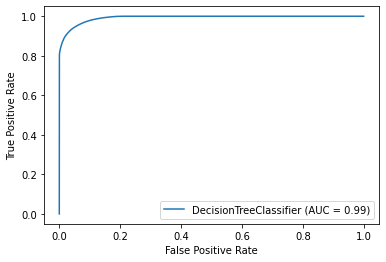

In [ ]:
plot_roc_curve(dt_classifier,X_train_new_rfe,y_train_new)

In [ ]:
y_test_pred = dt_classifier.predict(X_test[rfe_cols])
y_test_pred_prob = dt_classifier.predict_proba(X_test[rfe_cols])

In [ ]:
model2 = performance_metrics('Decision Tree',y_test,y_test_pred,y_test_pred_prob)
model2

,Model,Sensitivity,Specificity,Precision,Recall,F1_Score,ROC_AUC,Accuracy
0,Decision Tree,0.632,0.921222,0.421708,0.632,0.50587,0.856999,0.897123


In [ ]:
Final_Model = Final_Model.append(model2)

In [ ]:
metrics.confusion_matrix(y_test,y_test_pred)

array([[7601,  650],
       [ 276,  474]])

In [ ]:
dot_data = StringIO()  

export_graphviz(dt_classifier, out_file=dot_data, filled=True, rounded=True,
                feature_names=X_train_new_rfe.columns, 
                class_names=['Not Churn','Churn'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.700808 to fit



In [ ]:
print(classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

           0       0.96      0.92      0.94      8251
           1       0.42      0.63      0.51       750

    accuracy                           0.90      9001
   macro avg       0.69      0.78      0.72      9001
weighted avg       0.92      0.90      0.91      9001



### Feature Imporatnce From Decision Tree

In [ ]:
important_feature_dt = dt_classifier.feature_importances_
Features_dt = list(X_train_new_rfe.columns)
feature_importance_dt = pd.DataFrame({'Features': Features_dt,'Percentage':important_feature_dt*100})
feature_importance_dt = feature_importance_dt.sort_values('Percentage',ascending=False).reset_index(drop=True)
feature_importance_dt

,Features,Percentage
0,total_ic_mou_8,31.554168
1,roam_og_mou_8,12.278355
2,fb_user_8,6.465844
3,amt_data_8,4.617783
4,loc_ic_mou_8,4.057548
5,last_day_rch_amt_8,3.962120
6,roam_ic_mou_8,2.516679
7,total_rech_num_8,2.227772
8,total_ic_mou_diff,2.188166
9,night_pck_user_8,2.021513


## Model 3

### Logistic Regression + PCA

In [ ]:
pca = PCA(random_state = 42)

In [ ]:
pca.fit(X_train_new)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
    svd_solver='auto', tol=0.0, whiten=False)

#### Components from the PCA

In [ ]:
pca.components_

array([[ 1.08182467e-01,  7.64780385e-02, -2.33634374e-03, ...,
         2.83335846e-02,  2.45471379e-02,  1.25136105e-02],
       [ 1.05291864e-01,  1.49723881e-01,  1.92540341e-01, ...,
         5.66253369e-02,  4.73672462e-02,  3.67834548e-02],
       [-3.81946200e-02,  4.76729892e-02,  1.31757267e-01, ...,
         6.78295204e-02,  2.74204764e-02,  5.03769013e-02],
       ...,
       [ 3.24782642e-01,  3.45998411e-01, -7.32833457e-01, ...,
         6.83692631e-04, -5.88575968e-02, -8.09702316e-03],
       [-0.00000000e+00, -1.27872924e-15,  1.29073334e-15, ...,
        -1.00041747e-01,  2.29101321e-02,  2.44238055e-02],
       [ 0.00000000e+00,  2.79791923e-16, -4.75270872e-16, ...,
         9.50008978e-02,  2.86285937e-02,  5.97973575e-02]])

In [ ]:
pca.explained_variance_ratio_

array([1.02718553e-01, 7.28839972e-02, 5.38218807e-02, 5.03068033e-02,
       4.61992829e-02, 3.65064946e-02, 3.54600375e-02, 3.35255101e-02,
       3.06397151e-02, 2.56904472e-02, 2.31469227e-02, 2.08090127e-02,
       1.93161542e-02, 1.80522068e-02, 1.65995093e-02, 1.43069724e-02,
       1.38282606e-02, 1.35835604e-02, 1.28629656e-02, 1.25608969e-02,
       1.21383814e-02, 1.15475113e-02, 1.13173304e-02, 1.11939316e-02,
       1.07640994e-02, 1.02440898e-02, 9.99692341e-03, 9.67373587e-03,
       9.39852020e-03, 9.27947904e-03, 9.10730504e-03, 8.86175183e-03,
       8.70840094e-03, 8.59373730e-03, 8.31386713e-03, 8.15405462e-03,
       7.31979173e-03, 7.26121116e-03, 6.93990447e-03, 6.86398139e-03,
       6.76948500e-03, 6.46295009e-03, 6.15184961e-03, 5.97244568e-03,
       5.67625897e-03, 5.13724993e-03, 5.08832300e-03, 4.89610168e-03,
       4.65125741e-03, 4.58603160e-03, 4.34774136e-03, 4.16750290e-03,
       4.15530831e-03, 3.96071846e-03, 3.80491499e-03, 3.73882127e-03,
      

#### Making a Scree Plot for the Explained Variance

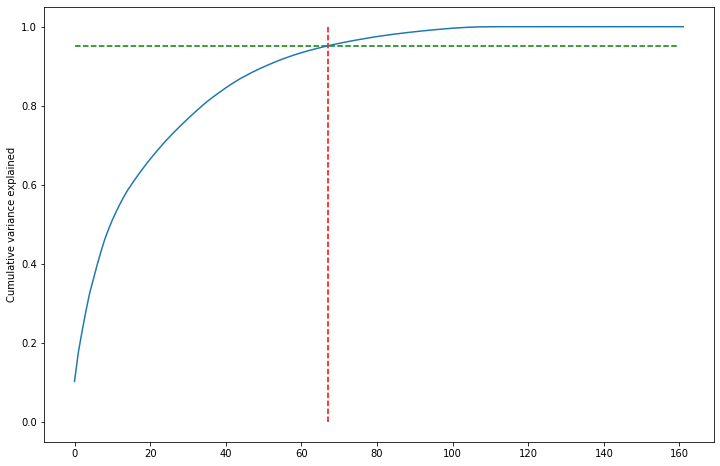

In [ ]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)

fig = plt.figure(figsize = [12,8])
plt.vlines(x=67, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.95, xmax=160, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.ylabel("Cumulative variance explained")
plt.show()

##### Observation: from the above scree plot it is observed that 95% of variance is explained by 70 Principal components

#### Lets perform PCA for 67 components

In [ ]:
pca_final = IncrementalPCA(n_components = 67)

In [ ]:
X_train_pca = pca_final.fit_transform(X_train_new)

In [ ]:
X_train_pca.shape

(38604, 67)

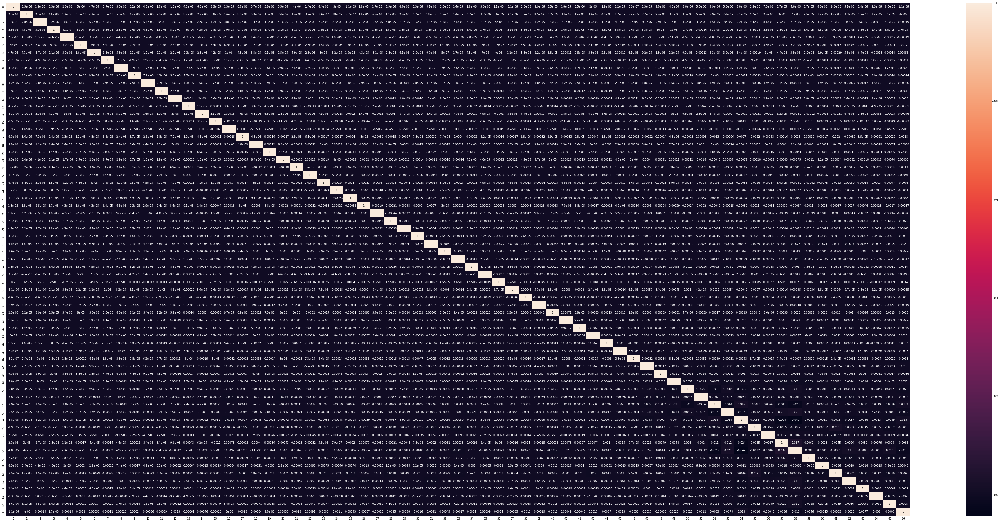

In [ ]:
corrmat = np.corrcoef(X_train_pca.transpose())
plt.figure(figsize=[75,35])
sns.heatmap(corrmat, annot=True)
plt.show()

#### Observation: It is observed that there is no correlation among the different principal components

In [ ]:
X_test_pca = pca_final.transform(X_test)
X_test_pca.shape

(9001, 67)

#### Applying Logistic Regression on the Principal Components

In [ ]:
logRegressor = LogisticRegression()

In [ ]:
model = logRegressor.fit(X_train_pca,y_train_new)

In [ ]:
pred_probs_test = model.predict_proba(X_test_pca)

In [ ]:
print('ROC_AUC_Score :',metrics.roc_auc_score(y_test, pred_probs_test[:,1]))

ROC_AUC_Score : 0.8860388639760838


#### PCA + Logistic regression by defining Variance 

In [ ]:
pca_final_2 = PCA(0.95,random_state = 42)

X_train_pca_2 = pca_final_2.fit_transform(X_train_new)

X_test_pca_2 = pca_final_2.transform(X_test)

logRegressor_2 = LogisticRegression(class_weight='balanced')

model_2 = logRegressor_2.fit(X_train_pca_2,y_train_new)

pred_probs_test_2 = model_2.predict(X_test_pca_2)

pred_prob = model_2.predict_proba(X_test_pca_2)

print(confusion_matrix(y_test,pred_probs_test_2))

[[6780 1471]
 [ 136  614]]


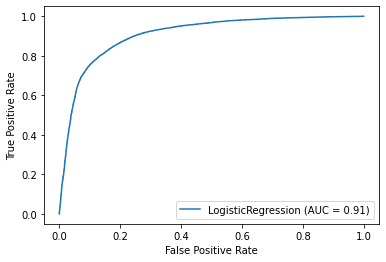

In [ ]:
plot_roc_curve(model_2, X_train_pca_2,y_train_new, drop_intermediate=False)
plt.show()

In [ ]:
model3 = performance_metrics('PCA + Logistic Regression',y_test,pred_probs_test_2,pred_prob)
model3

,Model,Sensitivity,Specificity,Precision,Recall,F1_Score,ROC_AUC,Accuracy
0,PCA + Logistic Regression,0.818667,0.821719,0.294484,0.818667,0.433157,0.883707,0.821464


In [ ]:
Final_Model = Final_Model.append(model3)

In [ ]:
print(classification_report(y_test, pred_probs_test_2))

              precision    recall  f1-score   support

           0       0.98      0.82      0.89      8251
           1       0.29      0.82      0.43       750

    accuracy                           0.82      9001
   macro avg       0.64      0.82      0.66      9001
weighted avg       0.92      0.82      0.86      9001



## Model 4

### Random Forest + PCA 

##### We use weight to handle class imblance 

In [ ]:
rf = RandomForestClassifier(criterion = 'gini',n_jobs = -1, oob_score = True)

In [ ]:
param = {'n_estimators': [10,25,50,100],'max_depth': [2,3,5,10,20],'min_samples_leaf': [5,10,20,50,100,200],
          'min_samples_split': range(200, 500, 200),'max_features': [12, 15, 20, 35] }

folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 42)

model_cv = GridSearchCV(estimator = rf, param_grid = param, cv = folds, n_jobs = -1, verbose = 1,
                       scoring = 'roc_auc')

model_cv.fit(X_train_pca,y_train)




Fitting 5 folds for each of 960 candidates, totalling 4800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:   54.8s
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 446 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 796 tasks      | elapsed: 22.8min
[Parallel(n_jobs=-1)]: Done 1246 tasks      | elapsed: 40.3min
[Parallel(n_jobs=-1)]: Done 1796 tasks      | elapsed: 67.0min
[Parallel(n_jobs=-1)]: Done 2446 tasks      | elapsed: 102.7min
[Parallel(n_jobs=-1)]: Done 3196 tasks      | elapsed: 164.4min
[Parallel(n_jobs=-1)]: Done 4046 tasks      | elapsed: 252.3min
[Parallel(n_jobs=-1)]: Done 4800 out of 4800 | elapsed: 339.5min finished


In [ ]:
print("Best AUC: ", model_cv.best_score_)
print("Best hyperparameters: ", model_cv.best_params_)


Best AUC:  0.8863540940542867
Best hyperparameters:  {'criterion': 'gini', 'max_depth': 10, 'max_features': 35, 'min_samples_leaf': 10, 'min_samples_split': 200, 'n_estimators': 100}


In [ ]:
rf = RandomForestClassifier(criterion =  'gini', max_depth = 10, max_features = 35,min_samples_split = 200, min_samples_leaf =  10, n_estimators = 100, n_jobs = -1, oob_score = True)

In [ ]:
rf.fit(X_train_pca,y_train_new)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=10, max_features=35,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=10, min_samples_split=200,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=True, random_state=None, verbose=0,
                       warm_start=False)

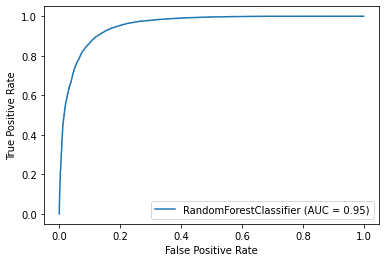

In [ ]:
plot_roc_curve(rf, X_train_pca, y_train_new)
plt.show()

In [ ]:
round(rf.oob_score_,2)

0.87

##### Observation : Out of Bag Score for Random forest is quiet good, this indicates that the model has performed very well for unseen data

In [ ]:
y_test_pred = rf.predict(X_test_pca)
y_test_pred_prob = rf.predict_proba(X_test_pca)

In [ ]:
model4 = performance_metrics('PCA + Random Forest',y_test,y_test_pred,y_test_pred_prob)
model4

,Model,Sensitivity,Specificity,Precision,Recall,F1_Score,ROC_AUC,Accuracy
0,PCA + Random Forest,0.748,0.88256,0.366667,0.748,0.492105,0.889721,0.871348


In [ ]:
Final_Model = Final_Model.append(model4)

In [ ]:
print(classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

           0       0.97      0.88      0.93      8251
           1       0.37      0.75      0.49       750

    accuracy                           0.87      9001
   macro avg       0.67      0.82      0.71      9001
weighted avg       0.92      0.87      0.89      9001



In [ ]:
print(confusion_matrix(y_test,y_test_pred))

[[7282  969]
 [ 189  561]]


In [ ]:
important_feature = rf.feature_importances_
Features = list(range(0,67))
feature_importance = pd.DataFrame({'Features': Features,'Percentage':important_feature*100})
feature_importance = feature_importance.sort_values('Percentage',ascending=False).reset_index(drop=True)
feature_importance

,Features,Percentage
0,1,38.731268
1,0,18.277269
2,4,7.763471
3,2,5.776679
4,10,3.678017
5,9,2.412550
6,11,1.205817
7,66,1.009483
8,32,0.929678
9,14,0.878770


## Model 5

### AdaBoost + PCA

In [ ]:
ada_classifier = AdaBoostClassifier()

decision_tree_classifier = DecisionTreeClassifier(max_depth = 1)

params = {'n_estimators':[10,25,50,75,100,150,200],
          'learning_rate':[0.1,0.25,0.5,1,2]}

folds = StratifiedKFold(n_splits=5,shuffle=True,random_state=42)

model_ada_cv = GridSearchCV(estimator = ada_classifier,param_grid = params,cv = folds, verbose = 1, n_jobs = -1, scoring = 'roc_auc', error_score = 'raise' )

model_ada_cv.fit(X_train_pca,y_train_new)



Fitting 5 folds for each of 35 candidates, totalling 175 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed: 12.9min
[Parallel(n_jobs=-1)]: Done 175 out of 175 | elapsed: 61.1min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             error_score='raise',
             estimator=AdaBoostClassifier(algorithm='SAMME.R',
                                          base_estimator=None,
                                          learning_rate=1.0, n_estimators=50,
                                          random_state=None),
             iid='deprecated', n_jobs=-1,
             param_grid={'learning_rate': [0.1, 0.25, 0.5, 1, 2],
                         'n_estimators': [10, 25, 50, 75, 100, 150, 200]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='roc_auc', verbose=1)

In [ ]:
print("Best AUC: ", model_ada_cv.best_score_)
print("Best hyperparameters: ", model_ada_cv.best_params_)


Best AUC:  0.9209200239755155
Best hyperparameters:  {'learning_rate': 1, 'n_estimators': 200}


In [ ]:
Adaboost_classifier = AdaBoostClassifier(n_estimators=200,learning_rate=1,random_state=42)

In [ ]:
Adaboost_classifier.fit(X_train_pca,y_train_new)

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1,
                   n_estimators=200, random_state=42)

In [ ]:
y_ada_pred_test = Adaboost_classifier.predict(X_test_pca)
y_ada_pred_prob_test = Adaboost_classifier.predict_proba(X_test_pca)

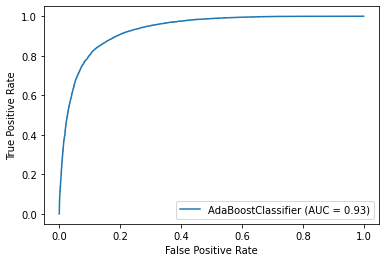

In [ ]:
plot_roc_curve(Adaboost_classifier, X_train_pca, y_train_new)

In [ ]:
model5 = performance_metrics('PCA + AdaBoost',y_test,y_ada_pred_test,y_ada_pred_prob_test)
model5

,Model,Sensitivity,Specificity,Precision,Recall,F1_Score,ROC_AUC,Accuracy
0,PCA + AdaBoost,0.744,0.851897,0.313483,0.744,0.441107,0.870597,0.842906


In [ ]:
Final_Model = Final_Model.append(model5)

In [ ]:
print(classification_report(y_test, y_ada_pred_test))

              precision    recall  f1-score   support

           0       0.97      0.85      0.91      8251
           1       0.31      0.74      0.44       750

    accuracy                           0.84      9001
   macro avg       0.64      0.80      0.67      9001
weighted avg       0.92      0.84      0.87      9001



## Model 6

### Xboost + PCA

In [ ]:
xgb_classifier = xgb.XGBClassifier(max_depth = 2,n_estimators=200,n_jobs = -1, objective = 'binary:logistic')
xgb_classifier.get_params()

{'base_score': 0.5,
 'booster': 'gbtree',
 'colsample_bylevel': 1,
 'colsample_bynode': 1,
 'colsample_bytree': 1,
 'gamma': 0,
 'learning_rate': 0.1,
 'max_delta_step': 0,
 'max_depth': 2,
 'min_child_weight': 1,
 'missing': None,
 'n_estimators': 200,
 'n_jobs': -1,
 'nthread': None,
 'objective': 'binary:logistic',
 'random_state': 0,
 'reg_alpha': 0,
 'reg_lambda': 1,
 'scale_pos_weight': 1,
 'seed': None,
 'silent': None,
 'subsample': 1,
 'verbosity': 1}

In [ ]:
params = {'learning_rate': [0.2, 0.6], 
             'subsample': [0.3, 0.6, 0.9]} 

folds = StratifiedKFold(n_splits=5,shuffle=True,random_state = 42)

model_xgb_cv = GridSearchCV(xgb_classifier,param_grid = params, scoring = 'roc_auc', n_jobs = -1, cv = folds, verbose = 1)

model_xgb_cv.fit(X_train_pca,y_train_new)


Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  6.3min finished


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             error_score=nan,
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bynode=1,
                                     colsample_bytree=1, gamma=0,
                                     learning_rate=0.1, max_delta_step=0,
                                     max_depth=2, min_child_weight=1,
                                     missing=None, n_estimators=200, n_jobs=-1,
                                     nthread=None, objective='binary:logistic',
                                     random_state=0, reg_alpha=0, reg_lambda=1,
                                     scale_pos_weight=1, seed=None, silent=None,
                                     subsample=1, verbosity=1),
             iid='deprecated', n_jobs=-1,
             param_grid={'learning_rate': [0.2, 0.6],
                         'subsample': [0.3, 0.6, 0.9]}

In [ ]:
print("Best AUC: ", model_xgb_cv.best_score_)
print("Best hyperparameters: ", model_xgb_cv.best_params_)

Best AUC:  0.9496061792922041
Best hyperparameters:  {'learning_rate': 0.6, 'subsample': 0.9}


In [ ]:
Xgboost_classifier = xgb.XGBClassifier(max_depth = 2,n_estimators=200,n_jobs = -1, objective = 'binary:logistic',learning_rate=0.6,subsample=0.9)

In [ ]:
Xgboost_classifier.fit(X_train_pca,y_train_new)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.6, max_delta_step=0, max_depth=2,
              min_child_weight=1, missing=None, n_estimators=200, n_jobs=-1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=0.9, verbosity=1)

In [ ]:
y_xgb_pred_test = Xgboost_classifier.predict(X_test_pca)
y_xgb_pred_prob_test = Xgboost_classifier.predict_proba(X_test_pca)

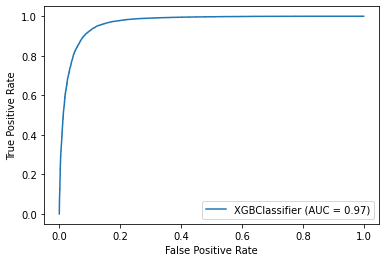

In [ ]:
plot_roc_curve(Xgboost_classifier, X_train_pca, y_train_new)

In [ ]:
model6 = performance_metrics('PCA + XGBoost',y_test,y_xgb_pred_test,y_xgb_pred_prob_test)
model6

,Model,Sensitivity,Specificity,Precision,Recall,F1_Score,ROC_AUC,Accuracy
0,PCA + XGBoost,0.733333,0.881105,0.359242,0.733333,0.482245,0.871425,0.868792


In [ ]:
Final_Model = Final_Model.append(model6)

In [ ]:
print(classification_report(y_test, y_xgb_pred_test))

              precision    recall  f1-score   support

           0       0.97      0.88      0.92      8251
           1       0.36      0.73      0.48       750

    accuracy                           0.87      9001
   macro avg       0.67      0.81      0.70      9001
weighted avg       0.92      0.87      0.89      9001



## Step 4 : Choosing the Best Model

### Comparision of Various models

In [ ]:
Final_Model.reset_index().drop('index',axis = 1)

,Model,Sensitivity,Specificity,Precision,Recall,F1_Score,ROC_AUC,Accuracy
0,Regularized Logistic Regression,0.809333,0.862077,0.347851,0.809333,0.486573,0.896608,0.857682
1,Decision Tree,0.632000,0.921222,0.421708,0.632000,0.505870,0.856999,0.897123
2,PCA + Logistic Regression,0.818667,0.821719,0.294484,0.818667,0.433157,0.883707,0.821464
3,PCA + Random Forest,0.748000,0.882560,0.366667,0.748000,0.492105,0.889721,0.871348
4,PCA + AdaBoost,0.744000,0.851897,0.313483,0.744000,0.441107,0.870597,0.842906
5,PCA + XGBoost,0.733333,0.881105,0.359242,0.733333,0.482245,0.871425,0.868792


### Observation : 
##### The Above DataFrame Final_Model represents metric values that are obtained by testing the model on the test set. Determing those custormers who might churn in the near future is a very important business metric to be considered, hence sensitivty is one of the important metric to be considered for accessing the performance of the model.

##### As the class imblance issue is solved by using Smote algorithm, hence we could also consider accuracy metric for determing the performance of the model.By considering these factors, the best amoung the various trained models are Random forest and logistic regression. It looks like Random forest can be considered for further analyses on the telcom chrn dataset

## Step 5: Selecting the Best Features 

### Important Features 

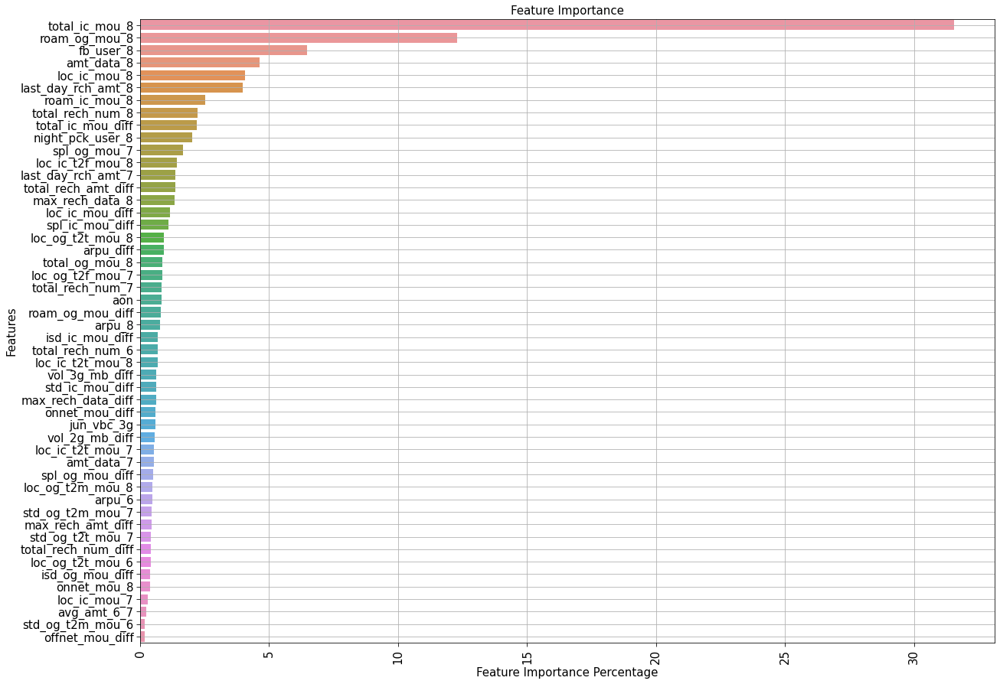

In [ ]:
plt.figure(figsize=[20,15])
sns.barplot(x = "Percentage",y="Features",data=feature_importance_dt)
plt.title("Feature Importance",size=15)
plt.xticks(rotation="vertical")
plt.ylabel("Features",size=15)
plt.xlabel("Feature Importance Percentage",size=15)
plt.tick_params(size=5,labelsize = 15) # Tick size in both X and Y axes
plt.grid(0.3)

## Insights

###### Top 10 Important variables to  be considered by the Telecom industry is :
- total_ic_mou_8
- roam_og_mou_8
- fb_user_8
- amt_data_8
- loc_ic_mou_8
- last_day_rch_amt_8
- total_rech_num_8
- roam_ic_mou_8
- total_ic_mou_diff
- night_pck_user_8

###### Recommendations :-
- Users who are using Roaming in incoming and outgoing calls are likely to churn, therefore companies have to impose certain deals for such custormers
- There is a large impact on total recharge amount, difference between 8th month and 6,7th month
- Telecom company should monitor on those custormers who are Night Users, facebook users, and similar social networking sites
- Therfore, Telecom industry can provide various deals or offers to such custormers so as to retain them 
